### Initial setup

In [1]:
# Import libraries
import pandas as pd
import numpy as np
from patsy import dmatrices, dmatrix
from scipy import stats
from scipy.special import expit as logistic
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import theano
import theano.tensor as tt
import pymc3 as pm
import arviz as az

import warnings
warnings.simplefilter(action="ignore")
%config InlineBackend.figure_format = 'retina' #For publications

print("Packages uploaded successfully!")

Packages uploaded successfully!


### Data preparation

In [2]:
# Read data
data = pd.read_csv('./machine_readable_dnt.csv')

# Standardise continuous values
data_prep = data[['SLogP', 'Cbrain/Cblood','Syn_EC30', 
                  'Viability_EC30', 'NNF EC50min', 'NNF EC50max', 'Viability_LDH']]
sc = StandardScaler()
data_scaled = sc.fit_transform(data_prep)
data_scaled = pd.DataFrame(data_scaled)
data_scaled.columns = ['SLogP', 'Cbrain/Cblood','Syn_EC30', 
                       'Viability_EC30', 'NNF EC50min', 'NNF EC50max', 'Viability_LDH']

#Add other discrete values and details
discrete = data [['Chemical', 'CASRN', 'DNT', 'BBB', 'Pgp_inhibition', 'Pgp_substrate', 'Pgp_active', 
  'BDNF, Reduction', 'Activity_Syn', 'Activity_NNF']]
data = discrete.join(data_scaled, lsuffix="_left", rsuffix="_right")

# Define predictors and outcomes

#BDNF given by continuous and discrete variables
x_bdnf = pd.DataFrame(data[['SLogP', 'Cbrain/Cblood', 'BBB', 
                            'Pgp_inhibition', 'Pgp_substrate', 'Pgp_active']]).values
y_bdnf = pd.DataFrame(data[['BDNF, Reduction']]).values

#Syn
x_syn = pd.DataFrame(data[['Syn_EC30', 'Viability_EC30']]).values
y_syn = pd.DataFrame(data[['Activity_Syn']]).values 

#NNF
x_nnf = pd.DataFrame(data[['NNF EC50min', 'NNF EC50max', 'Viability_LDH']]).values
y_nnf = pd.DataFrame(data[['Activity_NNF']]).values 

#x_dnt is given by causal relations BDNF->SYN->NNF->DNT<-BNDF
Y_dnt = pd.DataFrame(data[['DNT']]).values #Y because no missing values

### REGRESSION MODEL

### Strategy by distribution imputation

In [3]:
# Mask missing values

#BDNF
x_bdnf_missing = np.isnan(x_bdnf)
X_bdnf_train = np.ma.masked_array(x_bdnf, mask=x_bdnf_missing)
y_bdnf_missing = np.isnan(y_bdnf)
Y_bdnf_train = np.ma.masked_array(y_bdnf, mask=y_bdnf_missing)

#Syn
x_syn_missing = np.isnan(x_syn)
X_syn_train = np.ma.masked_array(x_syn, mask=x_syn_missing)
y_syn_missing = np.isnan(y_syn)
Y_syn_train = np.ma.masked_array(y_syn, mask=y_syn_missing)

#NNF
x_nnf_missing = np.isnan(x_nnf)
X_nnf_train = np.ma.masked_array(x_nnf, mask=x_nnf_missing)
y_nnf_missing = np.isnan(y_nnf)
Y_nnf_train = np.ma.masked_array(y_nnf, mask=y_nnf_missing)

### Define and fit the model

In [18]:
with pm.Model() as model_hierar:
    # Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    # Define priors
    beta_bdnf = pm.Normal('beta_bdnf', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_syn = pm.Normal('beta_syn', mu=mu_beta, sd=sd_beta, shape=(2,1))
    beta_nnf = pm.Normal('beta_nnf', mu=mu_beta, sd=sd_beta, shape=(3,1))
    
    # Imputation of X missing values for BDNF
    Xmu_bdnf = pm.Normal('Xmu_bdnf', mu=0, sd=1, shape=(1,6))
    Xsigma_bdnf = pm.HalfNormal('Xsigma_bdnf', sd=2, shape=(1,6))
    X_bdnf_modelled = pm.Normal('X_bdnf_modelled', 
                                         mu=Xmu_bdnf, sigma=Xsigma_bdnf, observed=X_bdnf_train)

    # Likelihood for BDNF
    # SLogP, Cbrain/Cblood, BBB, Pgp->BDNF
    lp_bdnf = pm.Deterministic('lp_bdnf', pm.math.dot(X_bdnf_modelled, beta_bdnf))
    y_obs_bdnf = pm.Bernoulli('y_obs_bdnf', logit_p=lp_bdnf, observed=Y_bdnf_train)
    
    # Imputation of X missing values for SYN
    Xmu_syn = pm.Normal('Xmu_syn', mu=0, sd=1, shape=(1,2))
    Xsigma_syn = pm.HalfNormal('Xsigma_syn', sd=2, shape=(1,2))
    X_syn_modelled = pm.Normal('X_syn_modelled',
                                 mu=Xmu_syn, sigma=Xsigma_syn, observed=X_syn_train)

    # Likelihood for SYN
    # BDNF->SYN
    lp_syn = pm.Deterministic('lp_syn', lp_bdnf + pm.math.dot(X_syn_modelled, beta_syn))
    y_obs_syn = pm.Bernoulli("y_obs_syn", logit_p=lp_syn, observed=Y_syn_train)
    
    # Imputation of X missing values for NNF
    Xmu_nnf = pm.Normal('Xmu_nnf', mu=0, sd=1, shape=(1,3))
    Xsigma_nnf = pm.HalfNormal('Xsigma_nnf', sd=2, shape=(1,3)) 
    X_nnf_modelled = pm.Normal('X_nnf_modelled',
                                 mu=Xmu_nnf, sd=Xsigma_nnf, observed=X_nnf_train)
   
    # Likelihood for NNF
    # BDNF->SYN->NNF
    lp_nnf = pm.Deterministic('lp_nnf', lp_syn + pm.math.dot(X_nnf_modelled, beta_nnf))
    y_obs_nnf = pm.Bernoulli("y_obs_nnf", logit_p=lp_nnf, observed=Y_nnf_train)
    
    # Define causal relationships for DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_bdnf + lp_syn + lp_nnf)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_dnt)

# Checking the proposed structure of model
model_hierar.check_test_point()

mu_beta                      3.69
sd_beta_log__               -0.77
beta_bdnf                  -13.82
beta_syn                    -4.61
beta_nnf                    -6.91
Xmu_bdnf                    -5.51
Xsigma_bdnf_log__           -4.62
X_bdnf_modelled_missing      0.00
y_obs_bdnf_missing           0.00
Xmu_syn                     -1.84
Xsigma_syn_log__            -1.54
X_syn_modelled_missing       0.00
y_obs_syn_missing            0.00
Xmu_nnf                     -2.76
Xsigma_nnf_log__            -2.31
X_nnf_modelled_missing       0.00
y_obs_nnf_missing            0.00
X_bdnf_modelled           -865.53
y_obs_bdnf                 -67.24
X_syn_modelled            -295.25
y_obs_syn                  -67.24
X_nnf_modelled            -452.89
y_obs_nnf                  -67.24
y_obs_dnt                  -67.24
Name: Log-probability of test_point, dtype: float64

In [19]:
# ## Run inferences and compute posterior distributions
with model_hierar:
    trace_hierar = pm.sample(cores=4, nuts ={'target_accept':0.90})
    #Predictions
    posterior_hierar = pm.sample_posterior_predictive(trace_hierar)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [X_nnf_modelled_missing, Xsigma_nnf, Xmu_nnf, X_syn_modelled_missing, Xsigma_syn, Xmu_syn, X_bdnf_modelled_missing, Xsigma_bdnf, Xmu_bdnf, beta_nnf, beta_syn, beta_bdnf, sd_beta, mu_beta]
>BinaryGibbsMetropolis: [y_obs_bdnf_missing, y_obs_syn_missing, y_obs_nnf_missing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 83 seconds.


In [26]:
# ## Convert and store in Arviz format
idata_hierar = az.from_pymc3(trace=trace_hierar, 
                             posterior_predictive=posterior_hierar,
                             model=model_hierar)
idata_hierar

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data

In [18]:
# ## Run inferences and return inferences for checking convergences
with model_hierar:
    trace_hierar_p = pm.sample(cores=4, return_inferencedata=True, nuts ={'target_accept':0.90})
    post_hierar_p = pm.sample_posterior_predictive(trace_hierar_p.posterior)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [X_nnf_modelled_missing, Xsigma_nnf, Xmu_nnf, X_syn_modelled_missing, Xsigma_syn, Xmu_syn, X_bdnf_modelled_missing, Xsigma_bdnf, Xmu_bdnf, beta_nnf, beta_syn, beta_bdnf, sd_beta, mu_beta]
>BinaryGibbsMetropolis: [y_obs_bdnf_missing, y_obs_syn_missing, y_obs_nnf_missing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 74 seconds.


### Check convergences

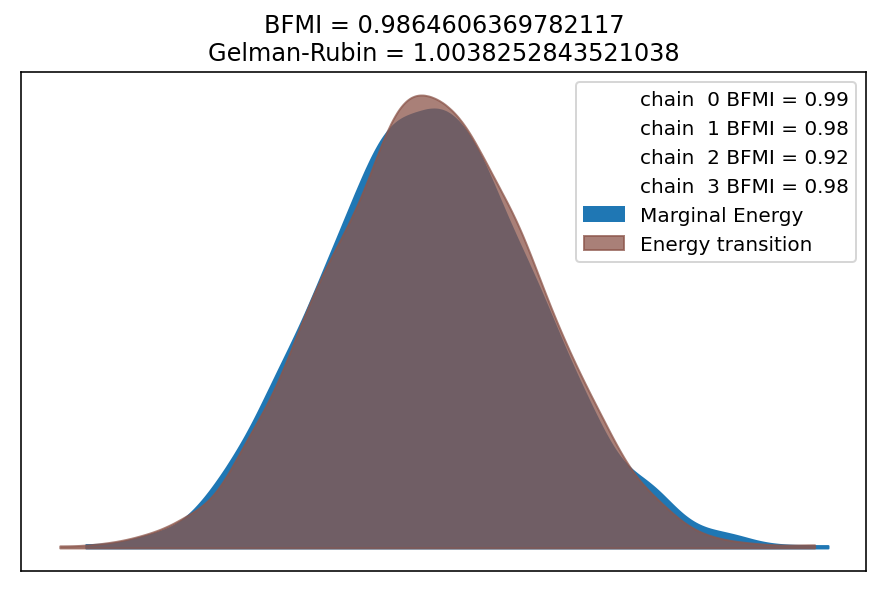

In [8]:
# Check the energy plot
bfmi = np.max(pm.stats.bfmi(trace_hierar))
max_gr = max(np.max(gr_stats) for gr_stats in pm.stats.rhat(trace_hierar).values()).values
(pm.energyplot(trace_hierar, legend=True, figsize=(6, 4))
   .set_title("BFMI = {}\nGelman-Rubin = {}".format(bfmi, max_gr)));

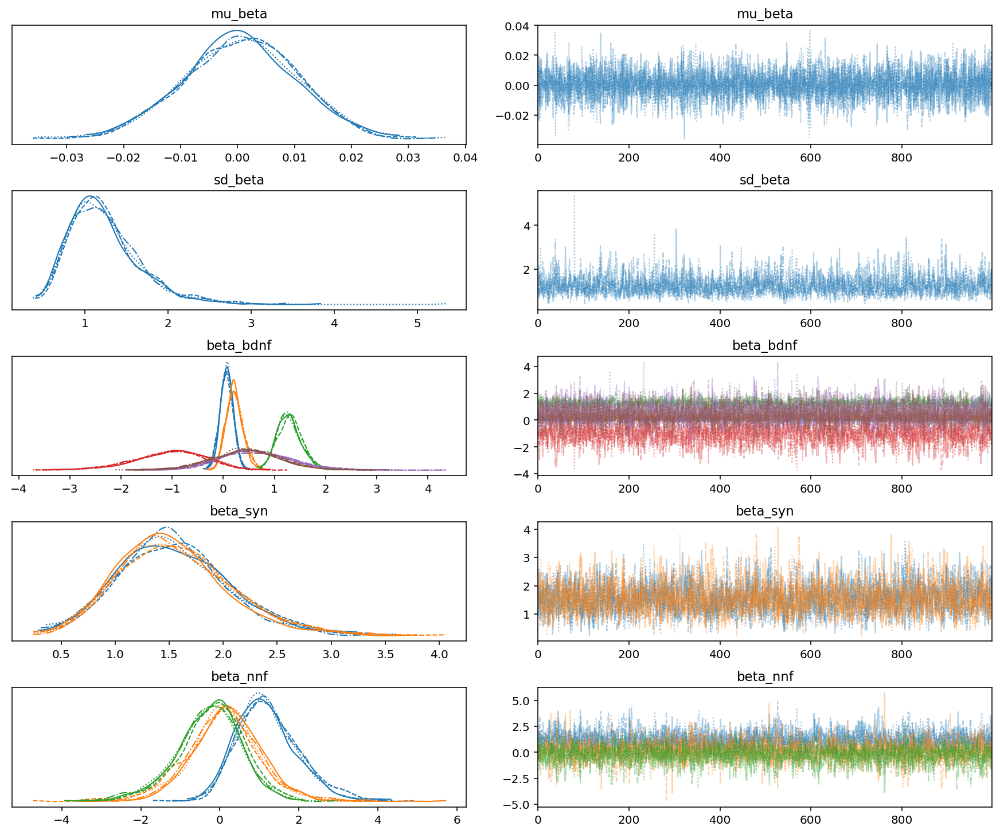

In [9]:
# Check hyperpriors and priors
pm.traceplot(trace_hierar, var_names=['mu_beta', 'sd_beta', 'beta_bdnf', 'beta_syn', 'beta_nnf']);

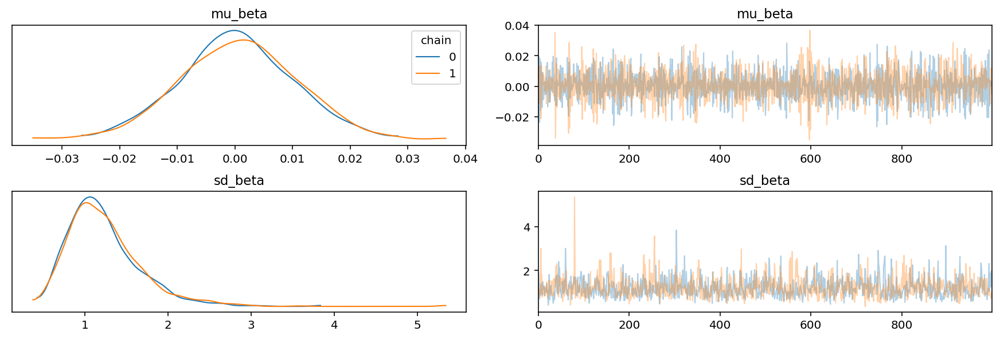

In [10]:
# Check convergence for hyperpriors of two chains
az.plot_trace(trace_hierar, var_names=['mu_beta', 'sd_beta'],
             coords={"chain":[0,1]}, legend=True)
#plt.suptitle("Trace plots")
plt.show();

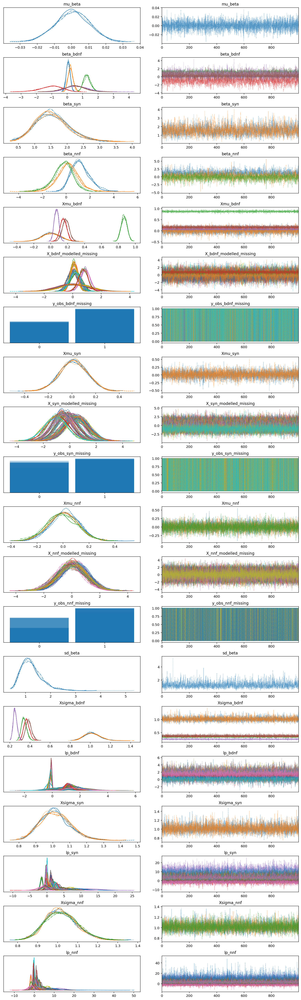

In [11]:
# Plot traces of all variables
pm.traceplot(trace_hierar);

In [12]:
# Statistical summary
stats = az.summary(trace_hierar, round_to=None)
stats
#Save the statistical summary of the trace
#file = az.summary(trace_hierar, round_to=None)
#file.to_csv('Statistical_summary_trace.csv')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
mu_beta,0.001,0.010,-0.017,0.019,0.000,0.000,8064.0,1434.0,8268.0,2807.0,1.0
"beta_bdnf[0,0]",0.063,0.130,-0.174,0.314,0.002,0.002,4050.0,3434.0,4046.0,3101.0,1.0
"beta_bdnf[1,0]",0.223,0.166,-0.081,0.542,0.003,0.002,3432.0,2710.0,3537.0,2812.0,1.0
"beta_bdnf[2,0]",1.294,0.243,0.825,1.717,0.006,0.004,1490.0,1490.0,1500.0,2200.0,1.0
"beta_bdnf[3,0]",-1.036,0.698,-2.404,0.185,0.014,0.011,2342.0,2105.0,2409.0,2484.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
"lp_dnt[92,0]",0.116,2.075,-3.772,4.165,0.036,0.030,3368.0,2316.0,3371.0,3006.0,1.0
"lp_dnt[93,0]",-2.585,2.796,-8.159,1.874,0.053,0.038,2782.0,2720.0,2797.0,2872.0,1.0
"lp_dnt[94,0]",0.093,2.077,-3.745,4.211,0.037,0.031,3224.0,2314.0,3223.0,2615.0,1.0
"lp_dnt[95,0]",0.092,2.061,-3.852,4.071,0.036,0.031,3278.0,2206.0,3275.0,2737.0,1.0


In [21]:
#Helper functions
#Source: https://github.com/corriebar/Bayesian-Workflow-with-PyMC
def convergence_hist(hist_data):
    fig, ax = plt.subplots(figsize=(6, 6))
    plt.hist(hist_data, bins=50, color="dimgray", ec="black", alpha=0.9, lw=1.2)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.yticks(ticks=None)

    return fig, ax

#R-hat
def check_rhat(inf_data, threshold=1.1, verbose=True):
    s = az.summary(inf_data, round_to="none")
    fig, ax = convergence_hist(s["r_hat"])
    ax.set_xlabel("$\hat{R}$ statistic", labelpad=15)
    #ax.set_title("$\hat{R}$")

    bad = s[s["r_hat"] > threshold]
    if len(bad) == 0:
        text = "None"
    else:
        text = list(bad.index)
        ax.axvline(x=threshold, c="#3d5167", lw=2)
    if verbose:
        print(f"The following parameters have an Rhat greater {threshold}:\n{text}\n")
    return fig, ax

#MCSE
def check_mcse(inf_data, threshold=0.1, verbose=True):
    s = az.summary(inf_data, round_to="none")
    hist_data = s["mcse_mean"] / s["sd"]
    fig, ax = convergence_hist(hist_data)
    ax.set_xlabel("Monte Carlo Standard Error (MCSE)/Posterior sd", labelpad=15)
    #ax.set_title("Monte Carlo Standard Error/Posterior sd")
    ax.locator_params(axis='x', nbins=5)

    bad = s[hist_data > threshold]
    if len(bad) == 0:
        text = "None"
    else:
        text = list(bad.index)
        ax.axvline(x=threshold, c="#3d5167", lw=2)
    if verbose:
        print(
            f"The following parameters have a Monte Carlo standard error greater than {threshold * 100}% of the posterior standard deviation:\n{text}\n")
    return fig, ax

#ESS/NEFF, number of effective sample size
def check_neff(inf_data, threshold=0.1, verbose=True):
    N = inf_data.posterior.dims['chain'] * inf_data.posterior.dims['draw']
    s = az.summary(inf_data, round_to="none")
    fig, ax = convergence_hist(s["ess_mean"] / N)
    ax.set_xlabel("Number of effective sample size (ESS) / Number of iterations", labelpad=15)
    #ax.set_title("$n_{eff}/N$")

    bad = s[s["ess_mean"] / N < threshold]
    if len(bad) == 0:
        text = "None"
    else:
        text = list(bad.index)
        ax.axvline(x=threshold, c="#3d5167", lw=2)
    if verbose:
        print(
            f"The following parameters have an effective sample size less than {threshold * 100}% of the total sample size:\n{text}\n")
    return fig, ax

The following parameters have an Rhat greater 1.005:
None

The following parameters have a Monte Carlo standard error greater than 10.0% of the posterior standard deviation:
None

The following parameters have an effective sample size less than 10.0% of the total sample size:
None



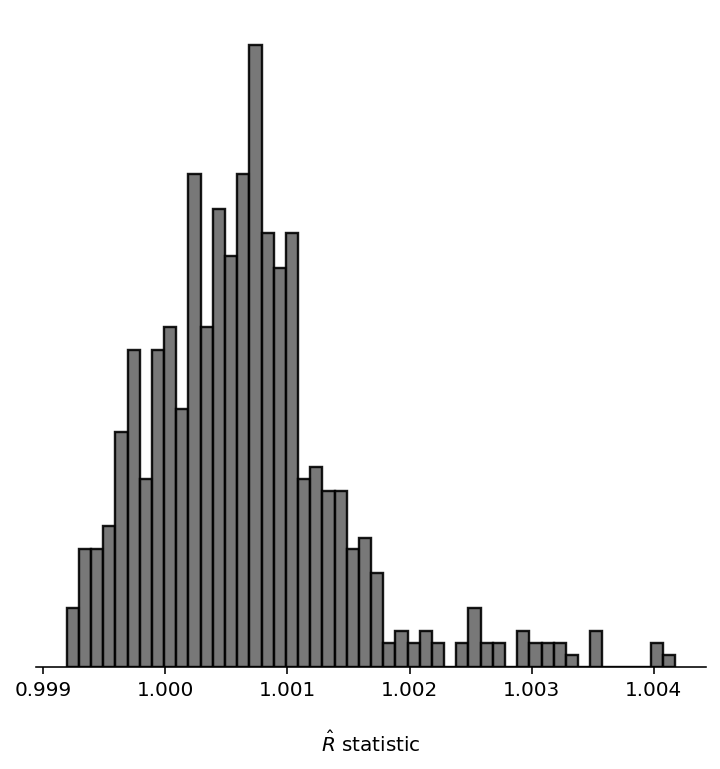

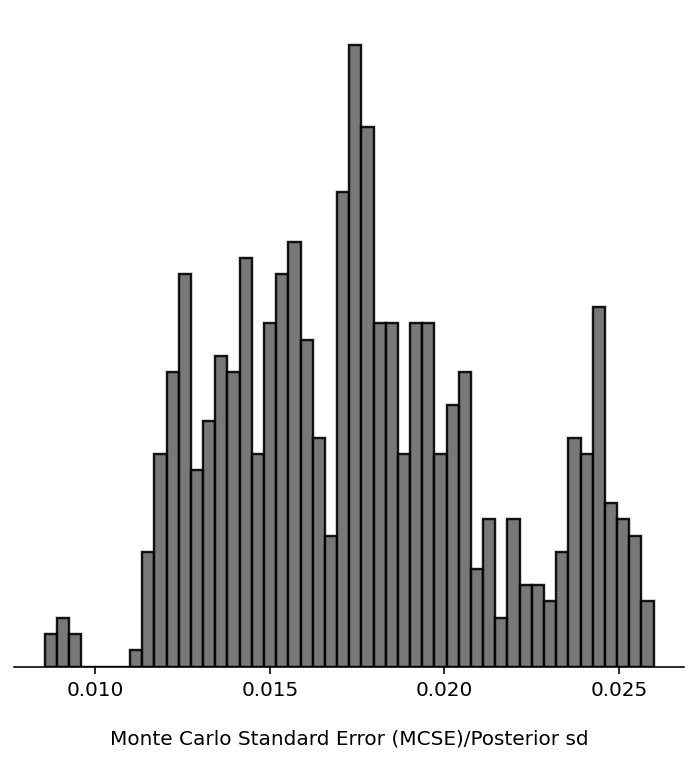

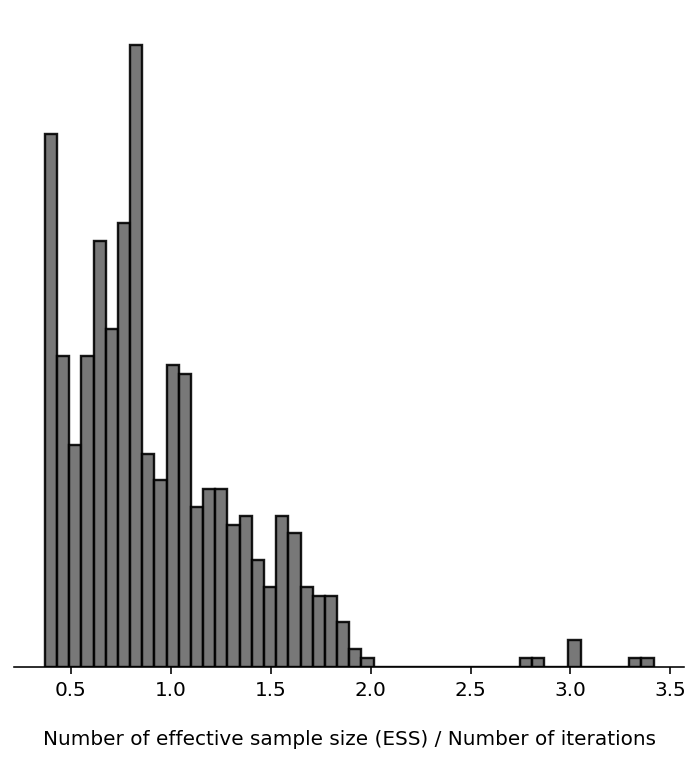

In [22]:
# Plot statistical summary of convergences
check_rhat(trace_hierar_p, threshold=1.005); #1.005 also considered
check_mcse(trace_hierar_p); 
check_neff(trace_hierar_p);

### Visualisations

In [20]:
# ## Define labels for plots
ylabels= data["Chemical"].astype(str) + " (" + data["CASRN"].astype(str) + ")"

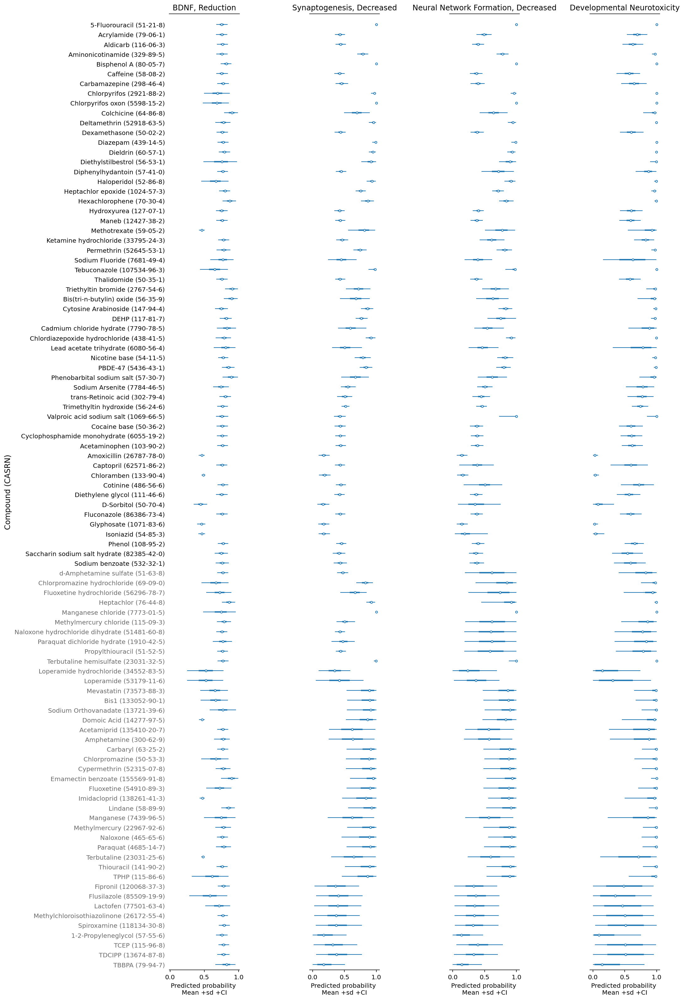

In [21]:
# ## Forestplots with underlying the compounds tested in both studies
fig, ax = plt.subplots(1, 4, figsize=(14,28), sharey=True)


ax0 = pm.forestplot(trace_hierar, 
                   var_names='lp_bdnf', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[0])
ax1 = pm.forestplot(trace_hierar, 
                   var_names='lp_syn', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[1])

ax2 = pm.forestplot(trace_hierar, 
                   var_names='lp_nnf', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[2])
ax3 = pm.forestplot(trace_hierar, 
                   var_names='lp_dnt', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[3])

ax[0].set_yticklabels(ylabels[::-1]) #weight = 'bold'

for ind in range(0,41):
    ax[0].get_yticklabels()[ind].set_color("dimgray") 

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean +sd +CI")

ax[0].set_ylabel("Compound (CASRN)", fontsize=12)
ax[0].set_title("BDNF, Reduction", fontsize=12)
ax[1].set_title("Synaptogenesis, Decreased", fontsize=12)
ax[2].set_title("Neural Network Formation, Decreased", fontsize=12)
ax[3].set_title("Developmental Neurotoxicity", fontsize=12);

plt.subplots_adjust(wspace=1)
#plt.tight_layout();

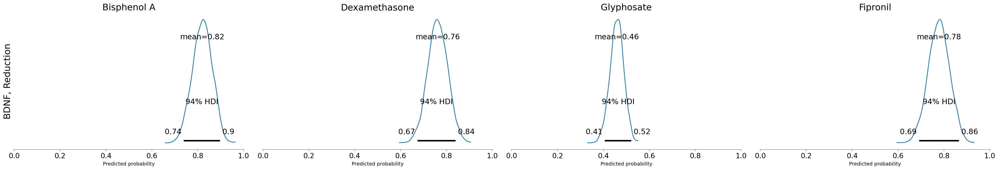

In [31]:
# --- LP (aka Theta) --- #
# ## Compare posteriors of four compounds: positive, positive & missing, negative and with missing data
# BDNF
ax = az.plot_posterior(idata_hierar.posterior, var_names='lp_bdnf', coords={'lp_bdnf_dim_0': [4, 11, 51, 88]}, 
                        transform=logistic)

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")
    
ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_ylabel("BDNF, Reduction", fontsize=18)

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18);
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

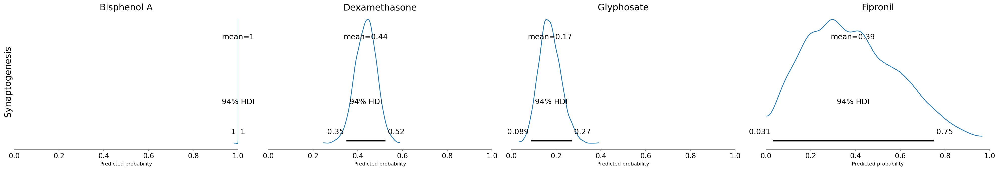

In [32]:
# SYN
ax = az.plot_posterior(idata_hierar.posterior, var_names='lp_syn', coords={'lp_syn_dim_0': [4, 11, 51, 88]}, 
                        transform=logistic)

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")
    
ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_ylabel("Synaptogenesis", fontsize=18)

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18);
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

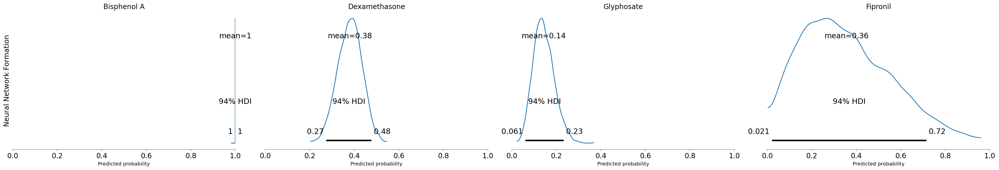

In [33]:
# NNF
ax = az.plot_posterior(idata_hierar.posterior, var_names='lp_nnf', coords={'lp_nnf_dim_0': [4, 11, 51, 88]}, 
                        transform=logistic)

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("Neural Network Formation", fontsize=14)
ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=14)
ax[1].set_title("Dexamethasone", fontsize=14);
ax[2].set_title("Glyphosate", fontsize=14)
ax[3].set_title("Fipronil", fontsize=14);

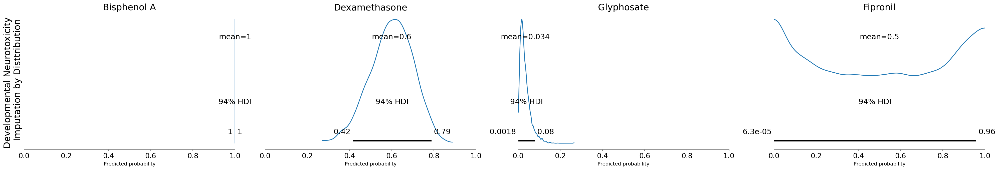

In [44]:
# DNT
ax = az.plot_posterior(idata_hierar.posterior, var_names='lp_dnt', coords={'lp_dnt_dim_0': [4, 11, 51, 88]},
                       transform=logistic)

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("Developmental Neurotoxicity \n Imputation by Disttribution", fontsize=18) 
#Causal Model, Regression Model, Distribution Imputation
ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])
ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

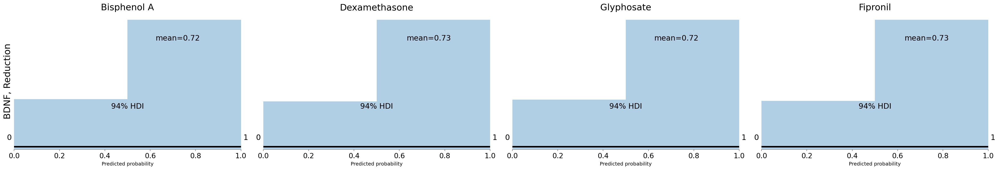

In [40]:
# --- Y obs --- #

# Plot posterior predictive for BDNF
ax = az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_bdnf',
                 coords={'y_obs_bdnf_dim_0': [4, 11, 51, 88]});

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("BDNF, Reduction", fontsize=18)

ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

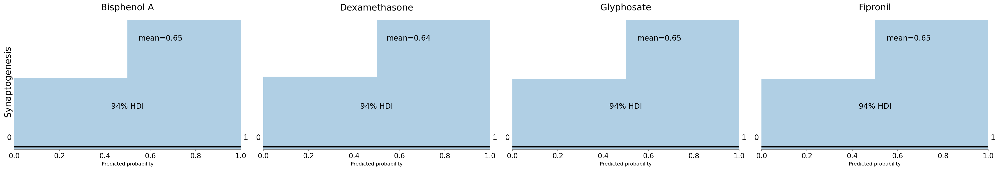

In [41]:
# Plot posterior predictive for SYN
ax = az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_syn',
                 coords={'y_obs_syn_dim_0': [4, 11, 51, 88]});

for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("Synaptogenesis", fontsize=18)

ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

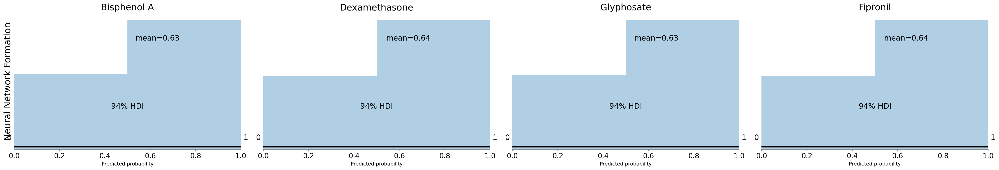

In [42]:
# Plot posterior predictive for NNF
ax = az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_nnf',
                 coords={'y_obs_nnf_dim_0': [4, 11, 51, 88]});
for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("Neural Network Formation", fontsize=18)

ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

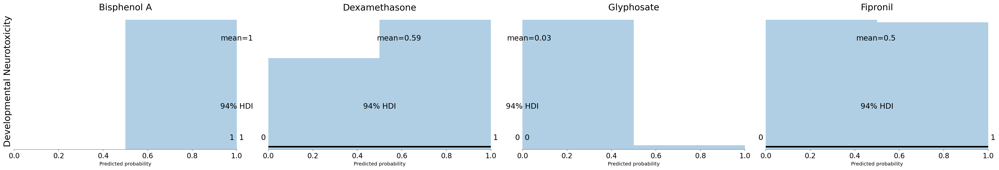

In [43]:
# Plot posterior predictive for DNT
ax = az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_dnt',
                 coords={'y_obs_dnt_dim_0': [4, 11, 51, 88]});
for ax_ in ax:
    ax_.set_xlabel("Predicted probability")

ax[0].set_ylabel("Developmental Neurotoxicity", fontsize=18)

ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

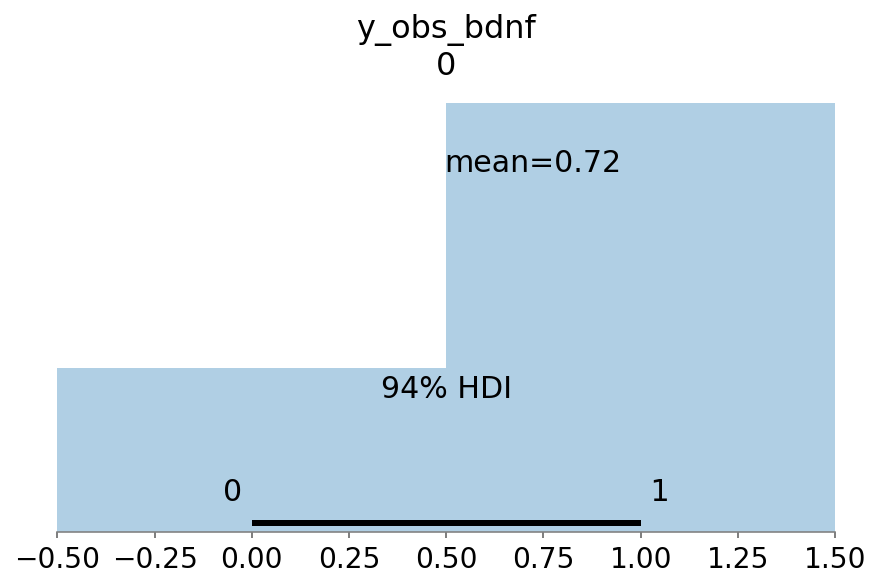

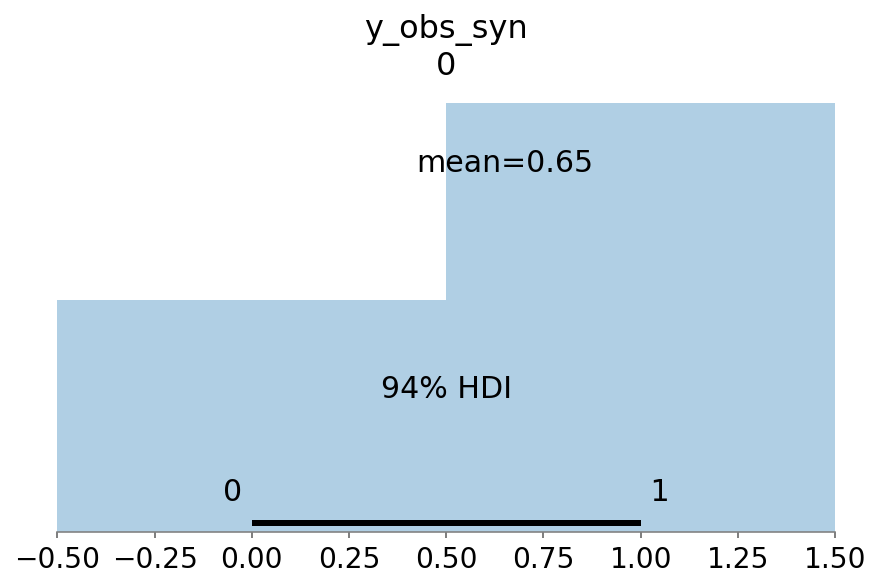

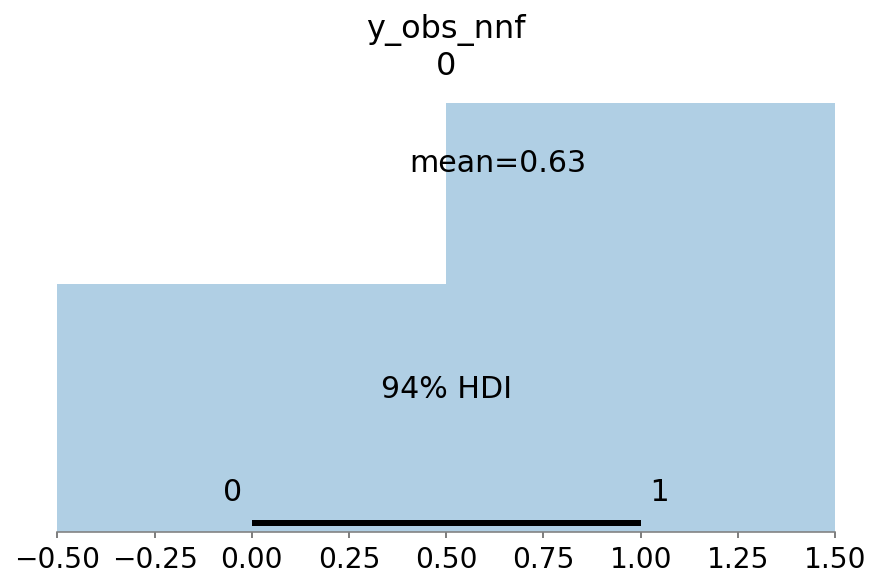

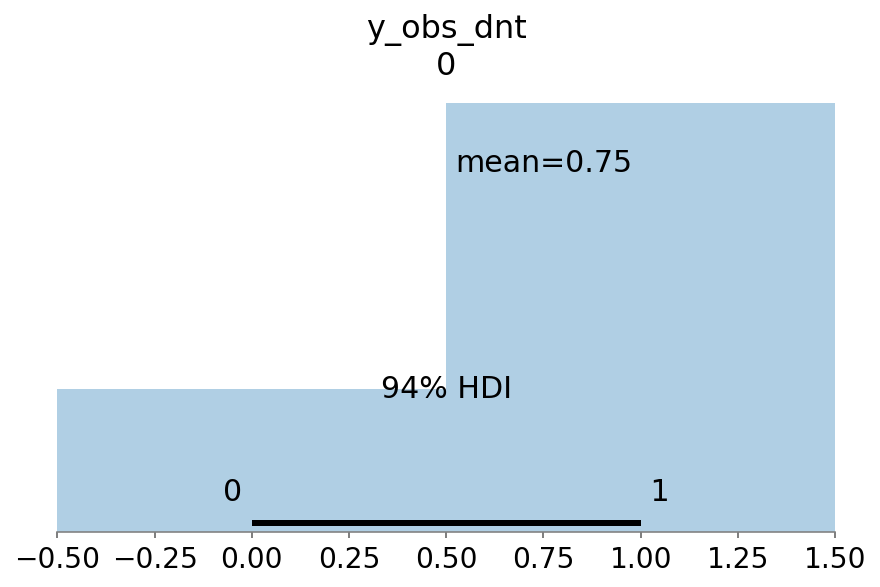

In [107]:
# The reason why for manuscript we present the predictions only for DNT
pm.plot_posterior(posterior_hierar, var_names='y_obs_bdnf');
pm.plot_posterior(posterior_hierar, var_names='y_obs_syn');
pm.plot_posterior(posterior_hierar, var_names='y_obs_nnf');
pm.plot_posterior(posterior_hierar, var_names='y_obs_dnt');

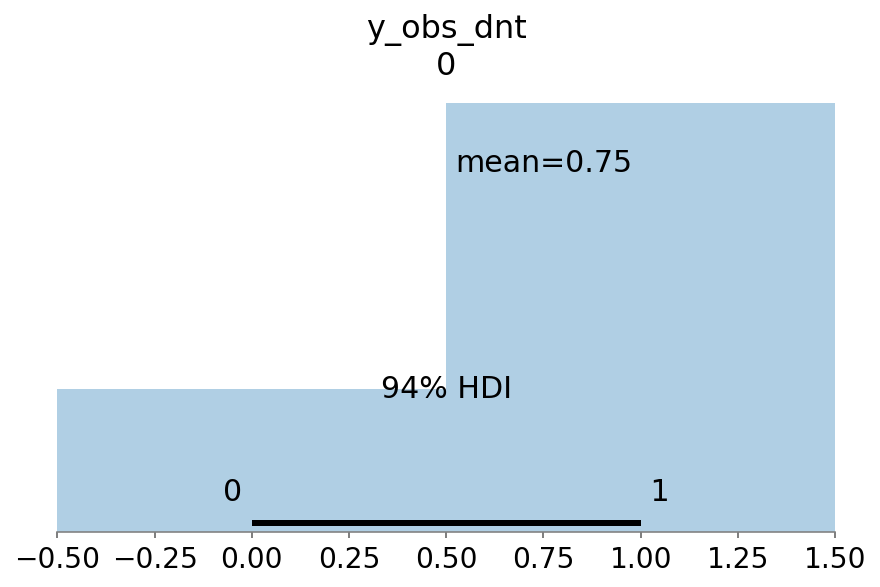

In [99]:
az.plot_posterior(post_hierar_p, var_names='y_obs_dnt'); #herein, post contains returninference=TRUE

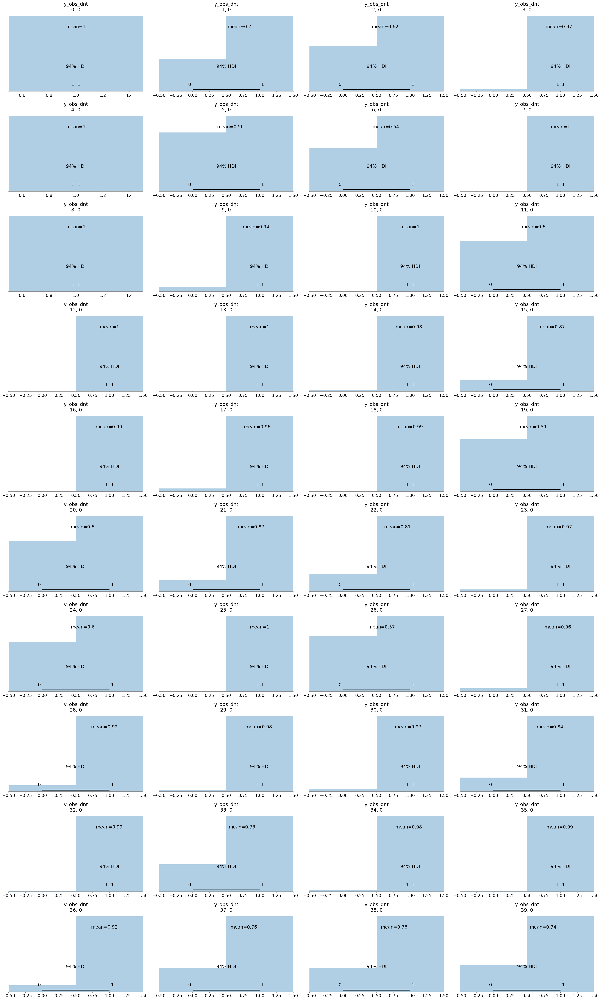

In [27]:
az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_dnt', 
                  coords={'y_obs_dnt_dim_0': [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,
                                             27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,
                                             51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73]});

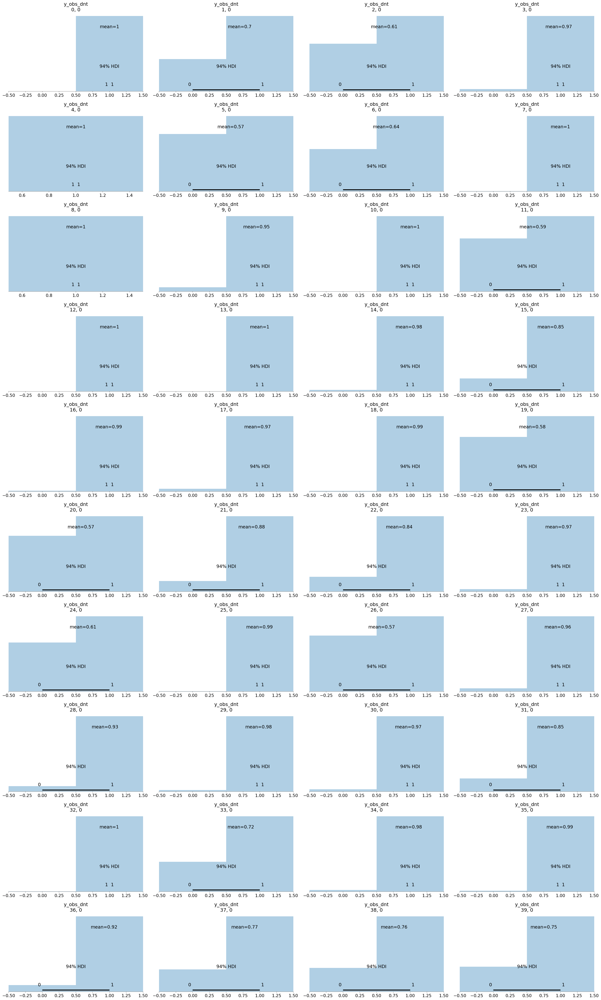

In [105]:
# Plot posterior predictive for DNT for all compounds
az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_dnt', filter_vars="like");

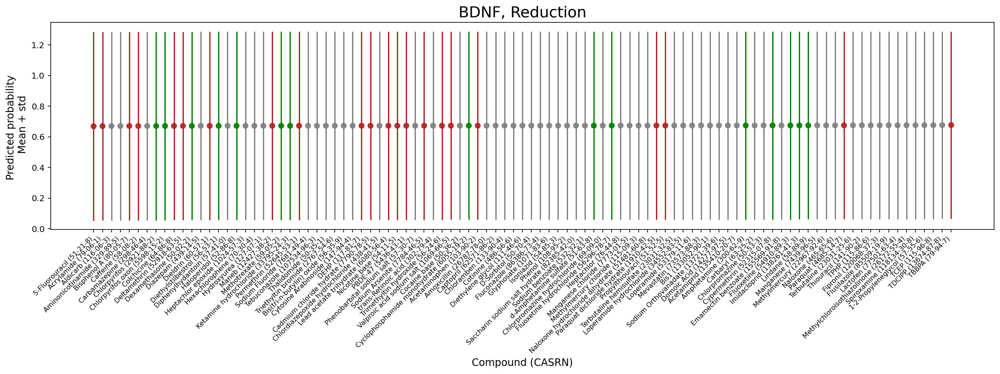

In [47]:
# ## Ordered compounds for each key event based on mean and hdi
# BDNF - undo the right way
lp_bdnf_mean = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_bdnf'].mean(axis=0))), index=ylabels)
lp_bdnf_std = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_bdnf'].std(axis=0))), index=ylabels)
order = lp_bdnf_mean.argsort()
y_bdnf_labeling = y_bdnf.copy()
y_bdnf_labeling[np.isnan(y_bdnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_bdnf_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_bdnf_mean)), lp_bdnf_mean[order], c=color_label, alpha = 0.9)
for i, m, se, color in zip(
    range(len(lp_bdnf_mean)),
    lp_bdnf_mean[order],
    lp_bdnf_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_bdnf_mean)))
ax.set_xticklabels(ylabels)
ax.set_ylabel("Predicted probability \n Mean + std", fontsize=12)
ax.set_xlabel("Compound (CASRN)", fontsize=12)
ax.set_title("BDNF, Reduction", fontsize=18)
fig.autofmt_xdate(rotation=45);
#ax.legend(['Yes', 'No', 'Missing', 'Yes']);
plt.tick_params(axis='x', which='major', labelsize=8);
#plt.tight_layout();

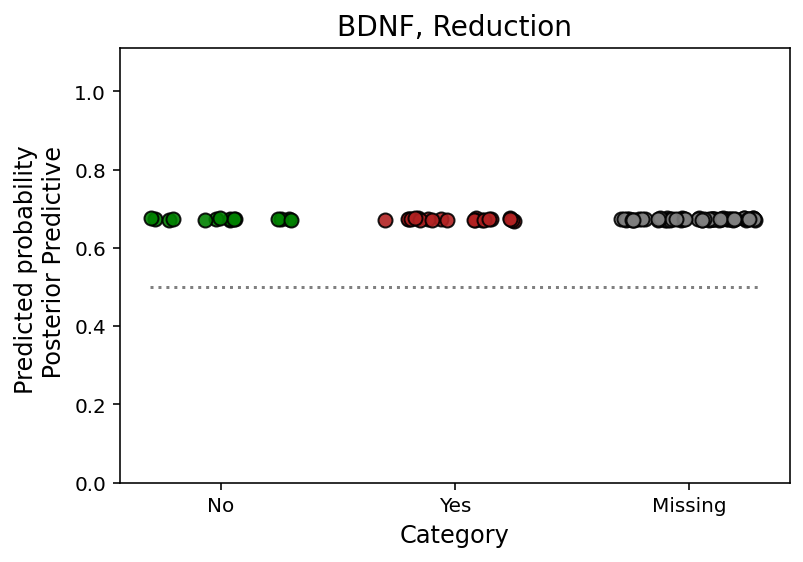

In [48]:
# BDNF
for i in range(3):
    values = lp_bdnf_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("BDNF, Reduction", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1115)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability \n Posterior Predictive", fontsize=12);

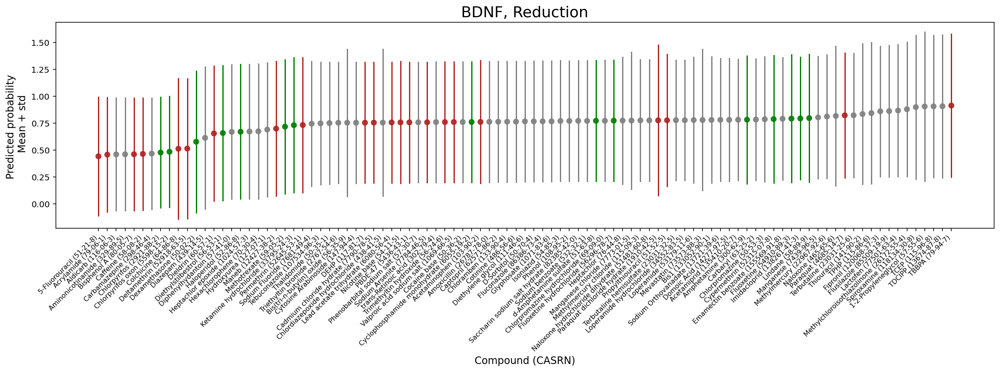

In [49]:
# ## Ordered compounds for each key event based on mean and hdi
# BDNF
lp_bdnf_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_bdnf'].mean(axis=0))), index=ylabels)
lp_bdnf_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_bdnf'].std(axis=0))), index=ylabels)
order = lp_bdnf_mean.argsort()
y_bdnf_labeling = y_bdnf.copy()
y_bdnf_labeling[np.isnan(y_bdnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_bdnf_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_bdnf_mean)), lp_bdnf_mean[order], c=color_label, alpha = 0.9)
for i, m, se, color in zip(
    range(len(lp_bdnf_mean)),
    lp_bdnf_mean[order],
    lp_bdnf_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_bdnf_mean)))
ax.set_xticklabels(ylabels)
ax.set_ylabel("Predicted probability \n Mean + std", fontsize=12)
ax.set_xlabel("Compound (CASRN)", fontsize=12)
ax.set_title("BDNF, Reduction", fontsize=18)
fig.autofmt_xdate(rotation=45);
#ax.legend(['Yes', 'No', 'Missing', 'Yes']);
plt.tick_params(axis='x', which='major', labelsize=8);
#plt.tight_layout();

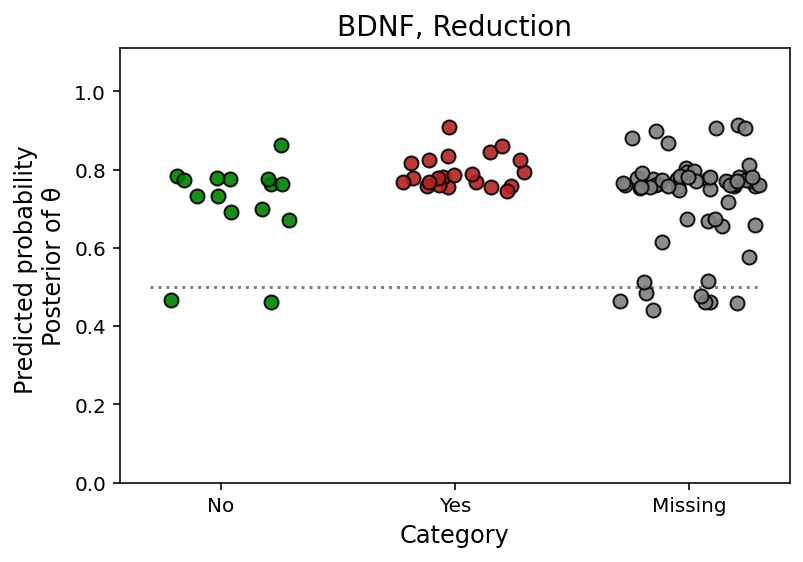

In [68]:
# BDNF
for i in range(3):
    values = lp_bdnf_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("BDNF, Reduction", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1115)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability \nPosterior of \u03B8", fontsize=12);

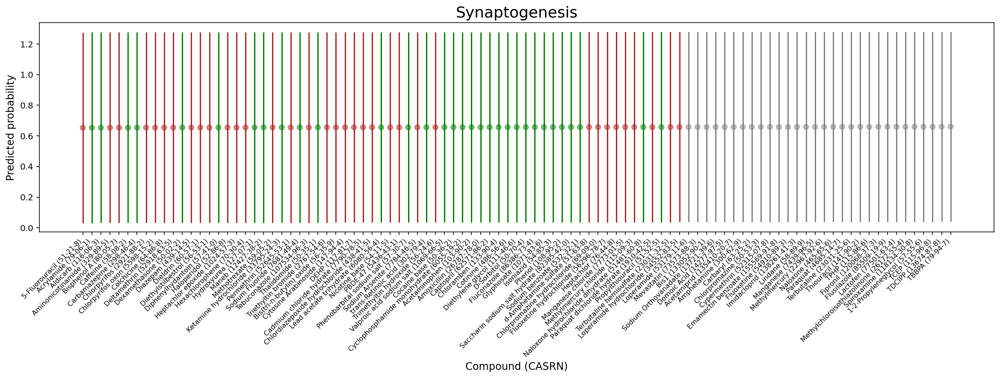

In [69]:
# SYN
lp_syn_mean = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_syn'].mean(axis=0))), index=ylabels)
lp_syn_std = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_syn'].std(axis=0))), index=ylabels)
order = lp_syn_mean.argsort()
y_syn_labeling = y_syn.copy()
y_syn_labeling[np.isnan(y_syn)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_syn_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_syn_mean)), lp_syn_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_syn_mean)),
    lp_syn_mean[order],
    lp_syn_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_syn_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability", fontsize=12)
ax.set_xlabel("Compound (CASRN)", fontsize=12)
ax.set_title("Synaptogenesis", fontsize=18)
plt.tick_params(axis='x', which='major', labelsize=8);
fig.autofmt_xdate(rotation=45);
#plt.tight_layout();

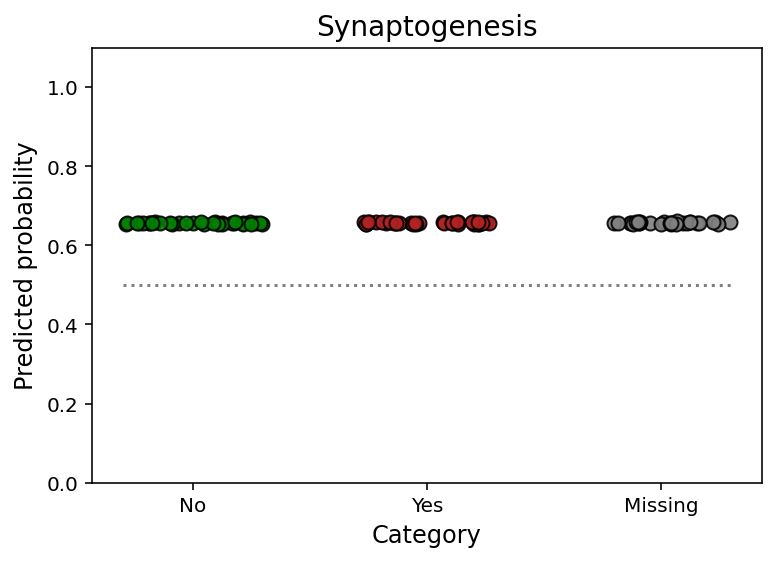

In [70]:
# SYN
for i in range(3):
    values = lp_syn_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Synaptogenesis", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray')
plt.ylabel("Predicted probability", fontsize=12);

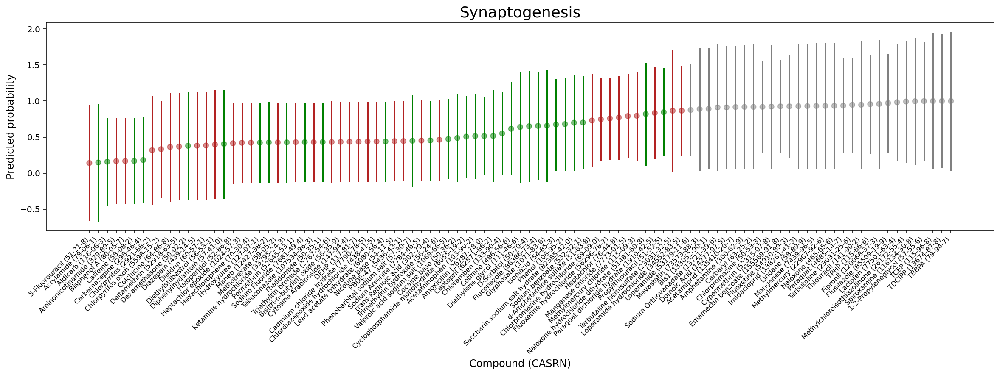

In [71]:
# SYN
lp_syn_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_syn'].mean(axis=0))), index=ylabels)
lp_syn_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_syn'].std(axis=0))), index=ylabels)
order = lp_syn_mean.argsort()
y_syn_labeling = y_syn.copy()
y_syn_labeling[np.isnan(y_syn)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_syn_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_syn_mean)), lp_syn_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_syn_mean)),
    lp_syn_mean[order],
    lp_syn_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_syn_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability", fontsize=12)
ax.set_xlabel("Compound (CASRN)", fontsize=12)
ax.set_title("Synaptogenesis", fontsize=18)
plt.tick_params(axis='x', which='major', labelsize=8);
fig.autofmt_xdate(rotation=45);
#plt.tight_layout();

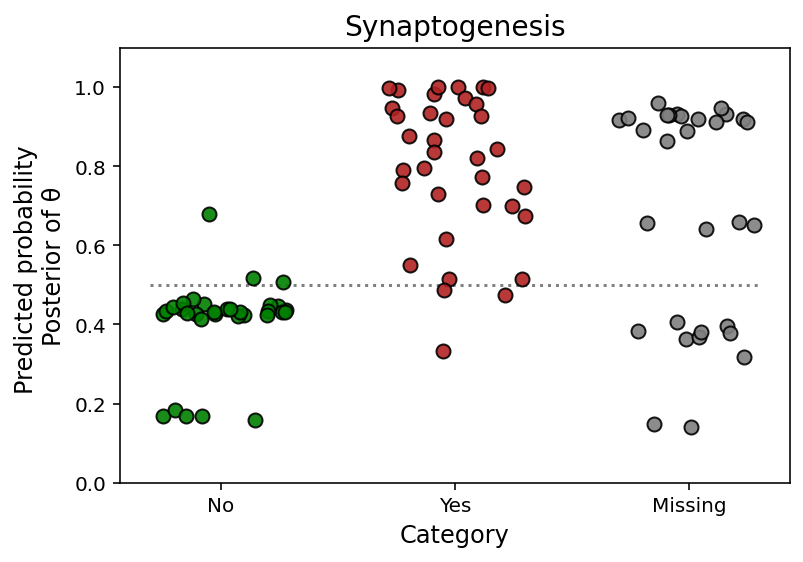

In [72]:
# SYN
for i in range(3):
    values = lp_syn_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Synaptogenesis", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray')
plt.ylabel("Predicted probability \nPosterior of \u03B8", fontsize=12);

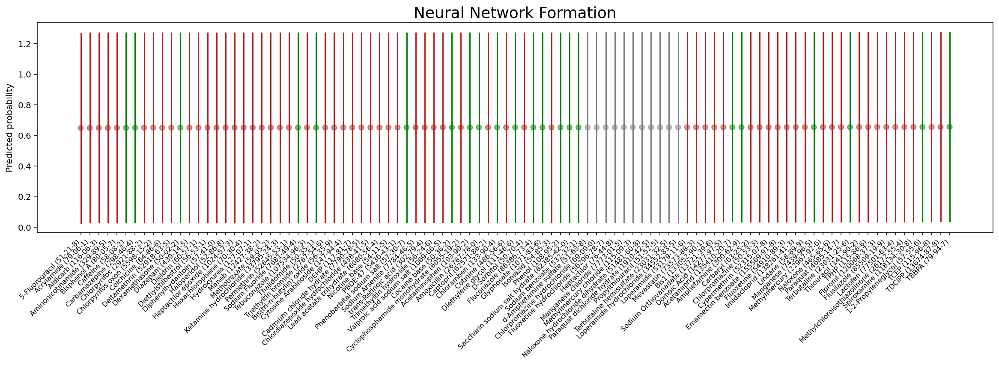

In [73]:
# NNF
lp_nnf_mean = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_nnf'].mean(axis=0))), index=ylabels)
lp_nnf_std = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_nnf'].std(axis=0))), index=ylabels)
order = lp_nnf_mean.argsort()
y_nnf_labeling = y_nnf.copy()
y_nnf_labeling[np.isnan(y_nnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_nnf_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_nnf_mean)), lp_nnf_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_nnf_mean)),
    lp_nnf_mean[order],
    lp_nnf_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_nnf_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability")
ax.set_title("Neural Network Formation", fontsize=18)
fig.autofmt_xdate(rotation=45);
#Legend

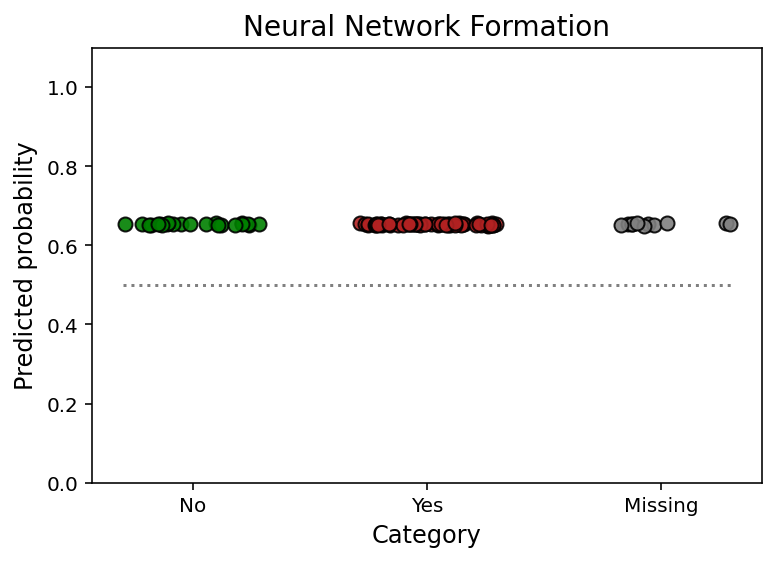

In [74]:
# NNF
for i in range(3):
    values = lp_nnf_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Neural Network Formation", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label='50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability", fontsize=12);

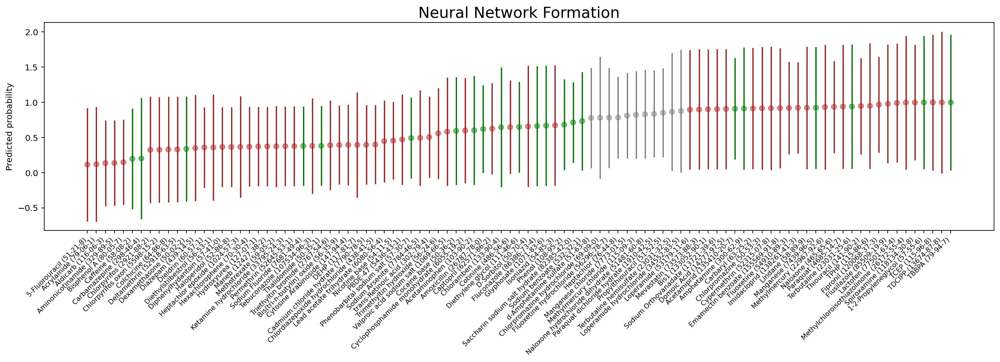

In [75]:
# NNF
lp_nnf_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_nnf'].mean(axis=0))), index=ylabels)
lp_nnf_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_nnf'].std(axis=0))), index=ylabels)
order = lp_nnf_mean.argsort()
y_nnf_labeling = y_nnf.copy()
y_nnf_labeling[np.isnan(y_nnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_nnf_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_nnf_mean)), lp_nnf_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_nnf_mean)),
    lp_nnf_mean[order],
    lp_nnf_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_nnf_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability")
ax.set_title("Neural Network Formation", fontsize=18)
fig.autofmt_xdate(rotation=45);
#Legend

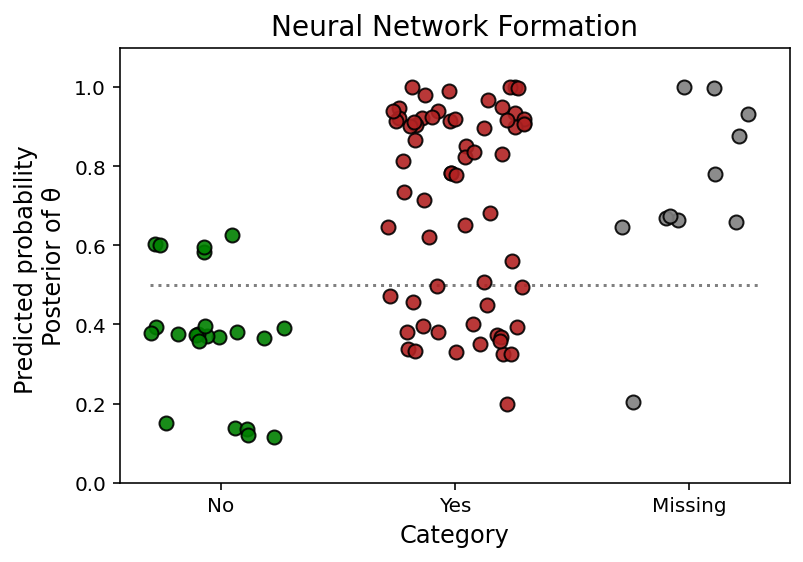

In [76]:
# NNF
for i in range(3):
    values = lp_nnf_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Neural Network Formation", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label='50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability \nPosterior of \u03B8", fontsize=12);

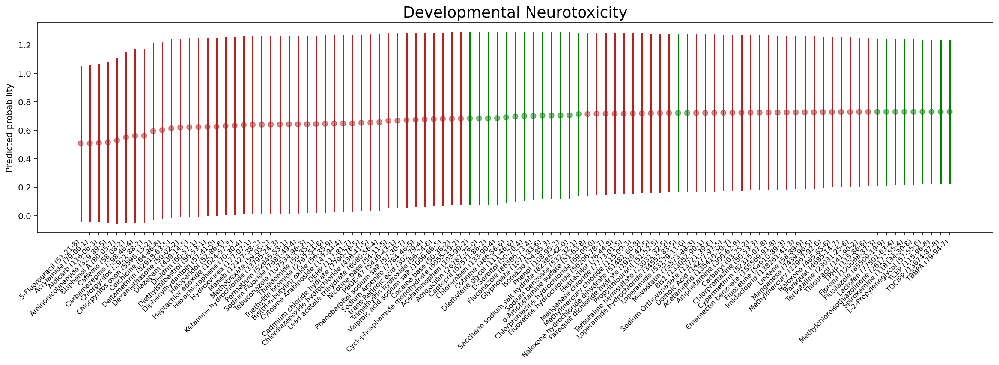

In [77]:
# DNT
lp_dnt_mean = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_dnt'].mean(axis=0))), index=ylabels)
lp_dnt_std = pd.Series(np.squeeze(logistic(posterior_hierar['y_obs_dnt'].std(axis=0))), index=ylabels)
order = lp_dnt_mean.argsort()
y_dnt_labeling = Y_dnt.copy()
y_dnt_labeling[np.isnan(Y_dnt)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_dnt_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_dnt_mean)), lp_dnt_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_dnt_mean)),
    lp_dnt_mean[order],
    lp_dnt_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_dnt_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability")
ax.set_title("Developmental Neurotoxicity", fontsize=18)
fig.autofmt_xdate(rotation=45);

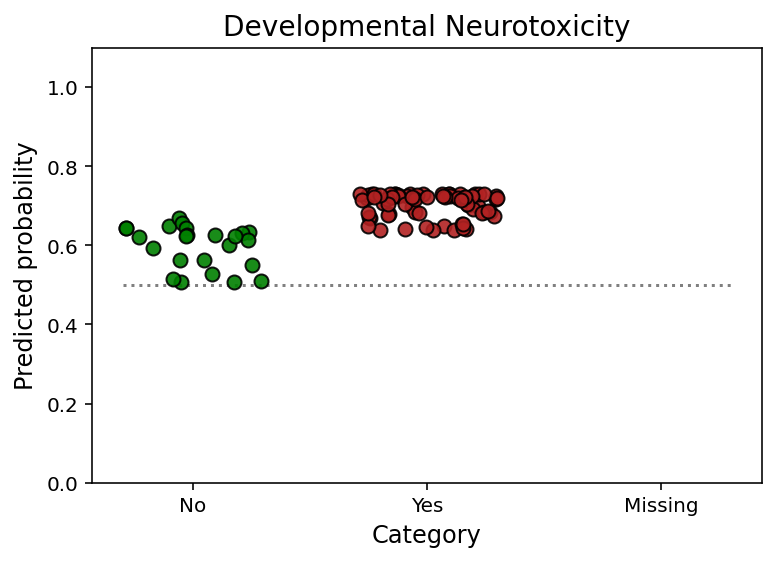

In [78]:
# DNT
for i in range(3):
    values = lp_dnt_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability", fontsize=12);

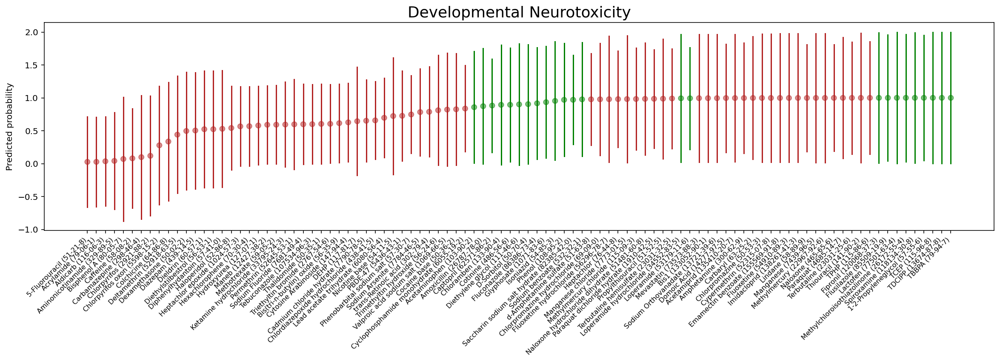

In [79]:
# DNT
lp_dnt_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].mean(axis=0))), index=ylabels)
lp_dnt_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].std(axis=0))), index=ylabels)
order = lp_dnt_mean.argsort()
y_dnt_labeling = Y_dnt.copy()
y_dnt_labeling[np.isnan(Y_dnt)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_dnt_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_dnt_mean)), lp_dnt_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_dnt_mean)),
    lp_dnt_mean[order],
    lp_dnt_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_dnt_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability")
ax.set_title("Developmental Neurotoxicity", fontsize=18)
fig.autofmt_xdate(rotation=45);

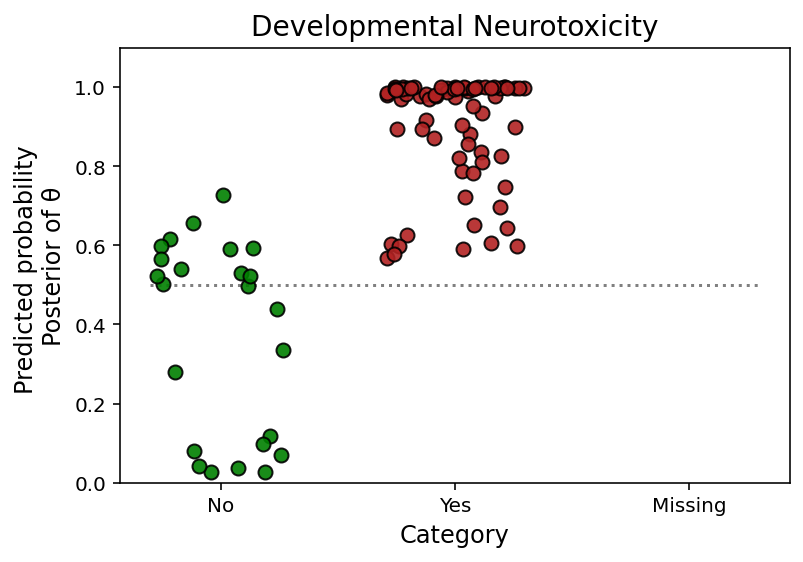

In [80]:
# DNT
for i in range(3):
    values = lp_dnt_mean.values[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted probability \nPosterior of \u03B8", fontsize=12);

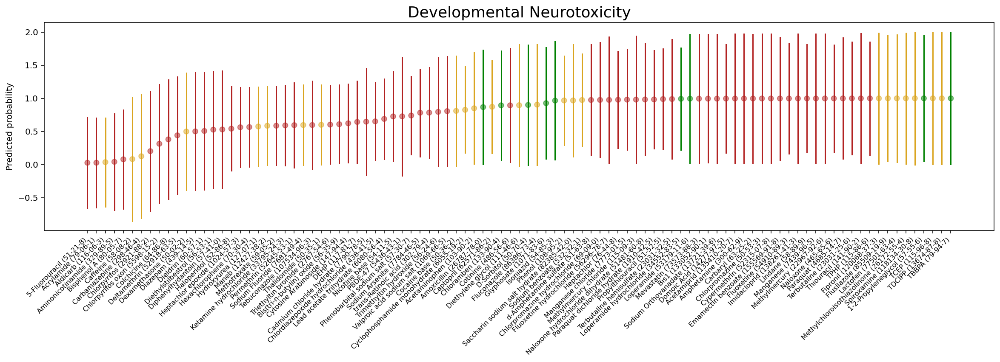

In [42]:
# ## Risk assessment for developmental neurotoxicity
# Ordered compounds and colour-coded 0<0.33<0.66<1 for each key event
lp_dnt_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].mean(axis=0))), index=ylabels)
lp_dnt_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].std(axis=0))), index=ylabels)
order = lp_dnt_mean.argsort()

#y_dnt_labeling = Y_dnt.copy()
#y_dnt_labeling[np.isnan(Y_dnt)] = 2.
new_labeling = np.zeros(lp_dnt_mean.values.shape, dtype=int)
new_labeling[lp_dnt_mean < .33] = 0
new_labeling[(lp_dnt_mean >= .33) & (lp_dnt_mean < .66)] = 1
new_labeling[lp_dnt_mean >= .66] = 2

cc = np.asarray(['green', 'goldenrod', 'firebrick'])
class_label = np.squeeze(new_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(range(len(lp_dnt_mean)), lp_dnt_mean[order], c=color_label, alpha = 0.5)
for i, m, se, color in zip(
    range(len(lp_dnt_mean)),
    lp_dnt_mean[order],
    lp_dnt_std[order],
    color_label):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(range(len(lp_dnt_mean)))
ax.set_xticklabels(ylabels, fontsize=8)
ax.set_ylabel("Predicted probability")
ax.set_title("Developmental Neurotoxicity", fontsize=18)
fig.autofmt_xdate(rotation=45);

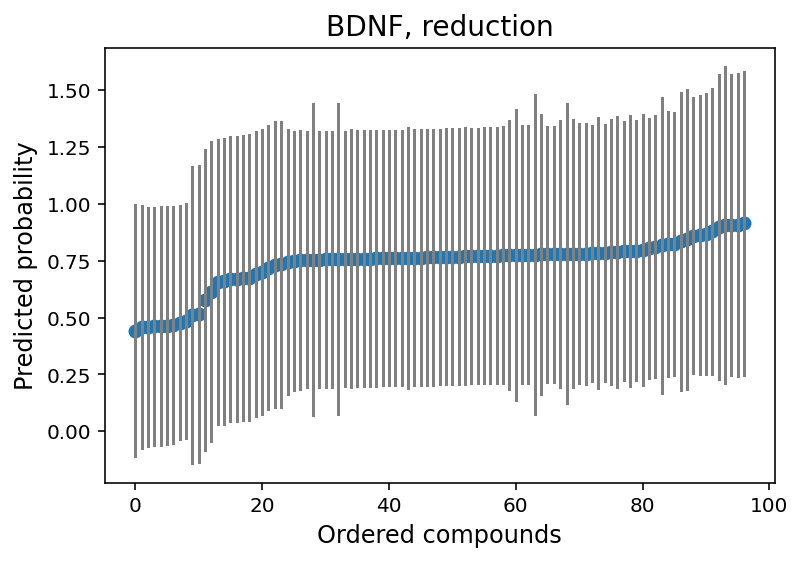

In [81]:
#My first try
lp_bdnf_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_bdnf'].mean(axis=0))), index=ylabels)
lp_bdnf_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_bdnf'].std(axis=0))), index=ylabels)
order = lp_bdnf_mean.argsort()

plt.scatter(range(len(lp_bdnf_mean)), lp_bdnf_mean[order])
for i, m, se in zip(range(len(lp_bdnf_mean)), lp_bdnf_mean[order],  lp_bdnf_std[order]):
    plt.plot([i,i], [m-se, m+se], 'gray')
    
plt.title("BDNF, reduction", fontsize=14)
plt.xlabel("Ordered compounds", fontsize=12)
plt.ylabel("Predicted probability", fontsize=12);

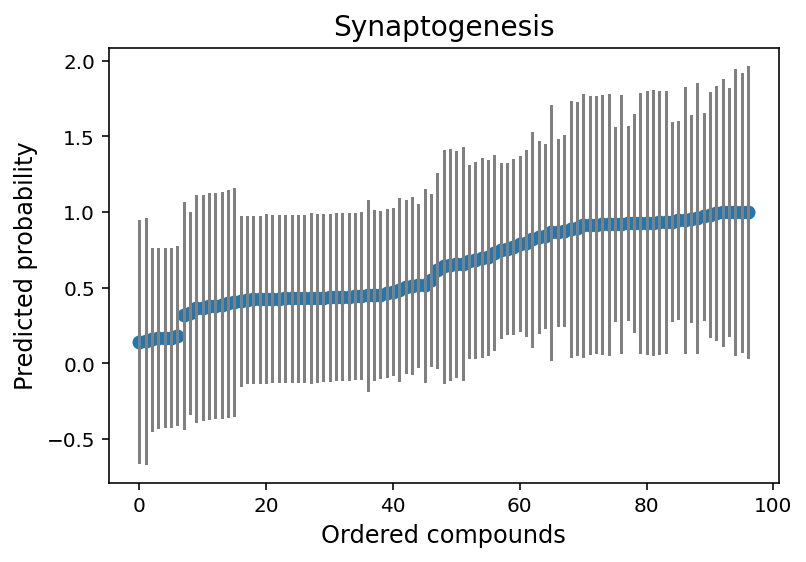

In [82]:
lp_syn_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_syn'].mean(axis=0))), index=ylabels)
lp_syn_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_syn'].std(axis=0))), index=ylabels)
order = lp_syn_mean.argsort()

plt.scatter(range(len(lp_syn_mean)), lp_syn_mean[order])
for i, m, se in zip(range(len(lp_syn_mean)), lp_syn_mean[order],  lp_syn_std[order]):
    plt.plot([i,i], [m-se, m+se], 'gray')
    
plt.title("Synaptogenesis", fontsize=14)
plt.xlabel("Ordered compounds", fontsize=12)
plt.ylabel("Predicted probability", fontsize=12);

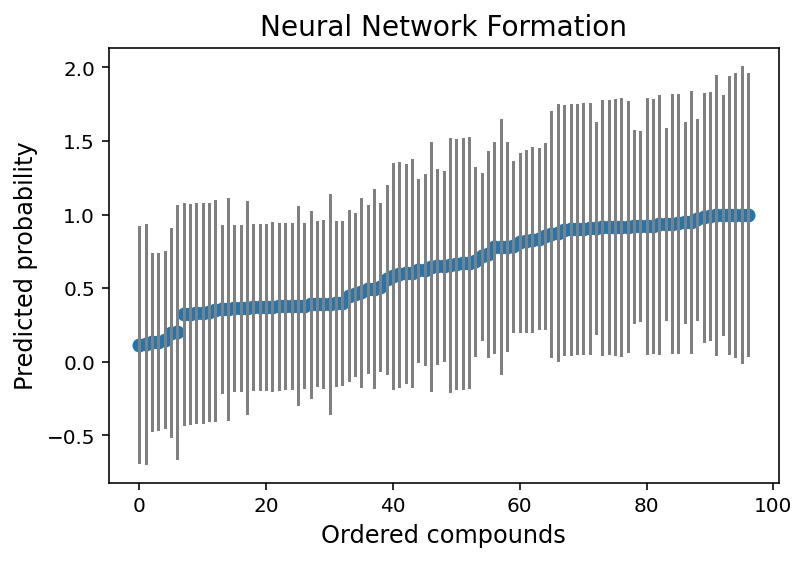

In [83]:
lp_nnf_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_nnf'].mean(axis=0))), index=ylabels)
lp_nnf_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_nnf'].std(axis=0))), index=ylabels)
order = lp_nnf_mean.argsort()

plt.scatter(range(len(lp_nnf_mean)), lp_nnf_mean[order])
for i, m, se in zip(range(len(lp_nnf_mean)), lp_nnf_mean[order],  lp_nnf_std[order]):
    plt.plot([i,i], [m-se, m+se], 'gray')
    
plt.title("Neural Network Formation", fontsize=14)
plt.xlabel("Ordered compounds", fontsize=12)
plt.ylabel("Predicted probability", fontsize=12);

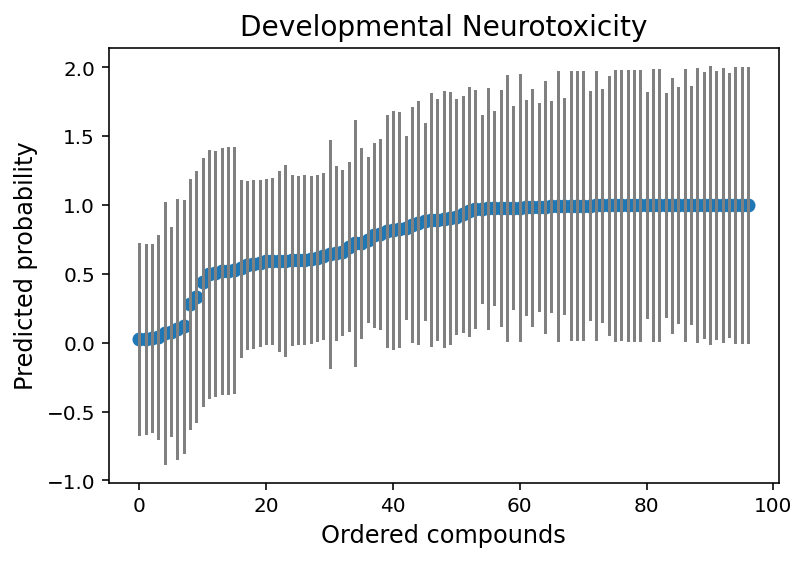

In [84]:
lp_dnt_mean = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].mean(axis=0))), index=ylabels)
lp_dnt_std = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].std(axis=0))), index=ylabels)
order = lp_dnt_mean.argsort()

plt.scatter(range(len(lp_dnt_mean)), lp_dnt_mean[order])
for i, m, se in zip(range(len(lp_dnt_mean)), lp_dnt_mean[order],  lp_dnt_std[order]):
    plt.plot([i,i], [m-se, m+se], 'gray')
    
plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Ordered compounds", fontsize=12)
plt.ylabel("Predicted probability", fontsize=12);

### Strategy: Mean imputation

In [15]:
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')

#BDNF
X_bdnf_meanimpute = imp_mean.fit_transform(x_bdnf)
Y_bdnf_meanimpute = imp_mean.fit_transform(y_bdnf)

#Syn
X_syn_meanimpute = imp_mean.fit_transform(x_syn)

#NNF
X_nnf_meanimpute = imp_mean.fit_transform(x_nnf)

### Define and fit the model

In [16]:
with pm.Model() as model_meanimpute:
    #Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    #Define priors
    beta_bdnf = pm.Normal('beta_bdnf', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_syn = pm.Normal('beta_syn', mu=mu_beta, sd=sd_beta, shape=(2,1))
    beta_nnf = pm.Normal('beta_nnf', mu=mu_beta, sd=sd_beta, shape=(3,1))
    # Likelihood for BDNF
    #SLogP, Cbrain/Cblood, BBB, Pgp->BDNF
    lp_bdnf = pm.Deterministic('lp_bdnf', pm.math.dot(X_bdnf_meanimpute, beta_bdnf)) 
    y_obs_bdnf = pm.Bernoulli('y_obs_bdnf', logit_p=lp_bdnf, observed=Y_bdnf_meanimpute)
    # Likelihood for Syn
    #BDNF->SYN
    lp_syn =  pm.Deterministic('lp_syn', lp_bdnf + pm.math.dot(X_syn_meanimpute, beta_syn))    
    y_obs_syn = pm.Bernoulli('y_obs_syn', logit_p = lp_syn, observed=y_syn)
    # Likelihood for NNF
    #BDNF->SYN->NNF
    lp_nnf = pm.Deterministic('lp_nnf', lp_syn + pm.math.dot(X_nnf_meanimpute, beta_nnf))
    y_obs_nnf = pm.Bernoulli('y_obs_nnf', logit_p=lp_nnf, observed=y_nnf)
    #Define causal relationships for DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_bdnf + lp_syn + lp_nnf)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_dnt)

# Checking the proposed structure of model
model_meanimpute.check_test_point()

mu_beta           3.69
sd_beta_log__    -0.77
beta_bdnf       -13.82
beta_syn         -4.61
beta_nnf         -6.91
y_obs_bdnf      -67.24
y_obs_syn       -67.24
y_obs_nnf       -67.24
y_obs_dnt       -67.24
Name: Log-probability of test_point, dtype: float64

In [17]:
# Make the inferences
with model_meanimpute:
    trace_meanimpute = pm.sample(cores=4, target_accept=0.90) #return_inferencedata=True,

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_nnf, beta_syn, beta_bdnf, sd_beta, mu_beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 31 seconds.


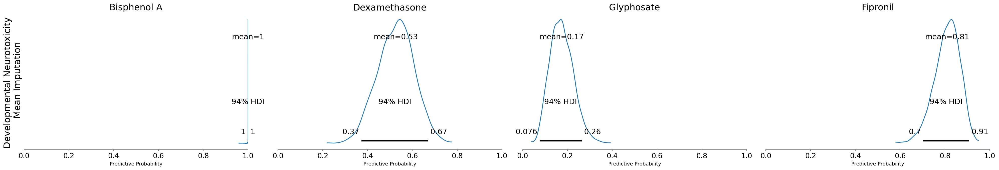

In [12]:
# DNT
ax = az.plot_posterior(trace_meanimpute, var_names='lp_dnt', coords={'lp_dnt_dim_0': [4, 11, 51, 88]},
                       transform=logistic)

ax[0].set_xlabel("Predictive Probability")
ax[1].set_xlabel("Predictive Probability")
ax[2].set_xlabel("Predictive Probability")
ax[3].set_xlabel("Predictive Probability")

ax[0].set_ylabel("Developmental Neurotoxicity \n Mean Imputation", fontsize=18)

ax[0].set_xlim([0,1.])
ax[1].set_xlim([0,1.])
ax[2].set_xlim([0,1.])
ax[3].set_xlim([0,1.])

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18);
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

### MULTIVARIATE MODEL

### Strategy by distribution imputation

### Define and fit the model

In [4]:
with pm.Model() as model_mvn:
    #Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    #Define priors
    beta_bdnf = pm.Normal('beta_bdnf', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_syn = pm.Normal('beta_syn', mu=mu_beta, sd=sd_beta, shape=(2,1))
    beta_nnf = pm.Normal('beta_nnf', mu=mu_beta, sd=sd_beta, shape=(3,1))

In [5]:
# ## Define BDNF 
with model_mvn:
    # Imputation of X missing values for BDNF
    Xmu_bdnf = pm.Normal('Xmu_bdnf', mu=0, sigma=1, 
                         shape=(X_bdnf_train.shape[-1] - 2, 1))
    _bdnf_raw = pm.Normal('_bdnf_raw', mu=0, sigma=1,
                          shape=(X_bdnf_train.shape[-1], X_bdnf_train.shape[0]))
    bdnf_chol, *_ = pm.LKJCholeskyCov(
        "bdnf_chol", 
        n=X_bdnf_train.shape[-1], eta=1.0, sd_dist=pm.HalfNormal.dist(1.0),
        compute_corr=True, store_in_trace=False
    )
    Xmu_bdnf_ = tt.concatenate([tt.zeros([2, 1]), Xmu_bdnf], axis=0)
    bdnf_rotated = (Xmu_bdnf_ + tt.dot(bdnf_chol, _bdnf_raw)).T
    bdnf_predictor_continue = pm.Normal(
        'bdnf_predictor_continue',
        mu=bdnf_rotated[:, :2], sigma=.05,
        observed=X_bdnf_train[:, :2])
    bdnf_predictor_binary = pm.Bernoulli(
        'bdnf_predictor_binary',
        logit_p=bdnf_rotated[:, 2:],
        observed=X_bdnf_train[:, 2:])
    
    X_bdnf_modelled = tt.concatenate(
        [bdnf_predictor_continue, bdnf_predictor_binary],
        axis=-1
    )

    # Likelihood for BDNF
    #SLogP, Cbrain/Cblood, BBB, Pgp->BDNF
    lp_bdnf = pm.Deterministic('lp_bdnf', tt.dot(X_bdnf_modelled, beta_bdnf))
    y_obs_bdnf = pm.Bernoulli('y_obs_bdnf', logit_p=lp_bdnf, observed=Y_bdnf_train)

In [6]:
# ## Define SYN
with model_mvn:
    # Imputation of X missing values for Syn
    syn_chol, *_ = pm.LKJCholeskyCov(
        "syn_chol", 
        n=X_syn_train.shape[-1], eta=1.0, sd_dist=pm.HalfNormal.dist(1.0),
        compute_corr=True, store_in_trace=False
    )
    X_syn_modelled = pm.MvNormal(
        'X_syn_modelled',
        mu=0., chol=syn_chol,
        observed=X_syn_train)
   
    # Likelihood for Syn
    #BDNF->SYN
    lp_syn =  pm.Deterministic('lp_syn', lp_bdnf + tt.dot(X_syn_modelled, beta_syn))    
    y_obs_syn = pm.Bernoulli("y_obs_syn", logit_p=lp_syn, observed=Y_syn_train)

In [7]:
# ## Define NNF
with model_mvn:
    # Imputation of X missing values for NNF
    nnf_chol, *_ = pm.LKJCholeskyCov(
        "nnf_chol", 
        n=X_nnf_train.shape[-1], eta=.5, sd_dist=pm.HalfNormal.dist(1.0),
        compute_corr=True, store_in_trace=False
    )
    X_nnf_modelled = pm.MvNormal(
        'X_nnf_modelled',
        mu=0., chol=nnf_chol,
        observed=X_nnf_train)
   
    # Likelihood for NNF
    #BDNF->SYN->NNF
    lp_nnf = pm.Deterministic('lp_nnf', lp_syn + tt.dot(X_nnf_modelled, beta_nnf))
    y_obs_nnf = pm.Bernoulli("y_obs_nnf", logit_p=lp_nnf, observed=Y_nnf_train)

In [8]:
# ## Define DNT
with model_mvn:
    #Define causal relationships for DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_bdnf + lp_syn + lp_nnf)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_dnt)

# ## Checking the proposed structure of model
model_mvn.check_test_point()

mu_beta                                3.69
sd_beta_log__                         -0.77
beta_bdnf                            -13.82
beta_syn                              -4.61
beta_nnf                              -6.91
Xmu_bdnf                              -3.68
_bdnf_raw                           -534.82
bdnf_chol_cholesky-cov-packed__       -0.92
bdnf_predictor_continue_missing        0.00
bdnf_predictor_binary_missing          0.00
y_obs_bdnf_missing                     0.00
syn_chol_cholesky-cov-packed__        -0.76
X_syn_modelled_missing                 0.00
y_obs_syn_missing                      0.00
nnf_chol_cholesky-cov-packed__         0.35
X_nnf_modelled_missing                 0.00
y_obs_nnf_missing                      0.00
bdnf_predictor_continue           -35997.10
bdnf_predictor_binary               -268.94
y_obs_bdnf                           -67.24
X_syn_modelled                      -245.27
y_obs_syn                            -67.24
X_nnf_modelled                  

In [9]:
# ## Make the inferences
with model_mvn:
    trace_mvn = pm.sample(cores=4, nuts ={'target_accept':0.90}) #return_inferencedata=True,

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [X_nnf_modelled_missing, nnf_chol, X_syn_modelled_missing, syn_chol, bdnf_predictor_continue_missing, bdnf_chol, _bdnf_raw, Xmu_bdnf, beta_nnf, beta_syn, beta_bdnf, sd_beta, mu_beta]
>BinaryGibbsMetropolis: [bdnf_predictor_binary_missing, y_obs_bdnf_missing, y_obs_syn_missing, y_obs_nnf_missing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 540 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


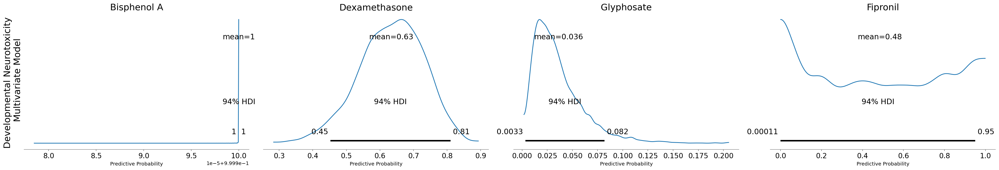

In [10]:
# DNT
ax = az.plot_posterior(trace_mvn, var_names='lp_dnt', coords={'lp_dnt_dim_0': [4, 11, 51, 88]},
                       transform=logistic)

ax[0].set_xlabel("Predictive Probability")
ax[1].set_xlabel("Predictive Probability")
ax[2].set_xlabel("Predictive Probability")
ax[3].set_xlabel("Predictive Probability")

ax[0].set_ylabel("Developmental Neurotoxicity \n Multivariate Model", fontsize=18)

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

### Strategy: Mean imputation

### Define and fit the model

In [ ]:
with pm.Model() as model_mvn_meanimpute:
    #Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    #Define priors
    beta_bdnf = pm.Normal('beta_bdnf', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_syn = pm.Normal('beta_syn', mu=mu_beta, sd=sd_beta, shape=(2,1))
    beta_nnf = pm.Normal('beta_nnf', mu=mu_beta, sd=sd_beta, shape=(3,1))

In [ ]:
with model_mvn_meanimpute:
    #LKJ prior for covariance matrix    
    bdnf_chol, corr, stds = pm.LKJCholeskyCov(
        'bdnf_chol', n=6, eta=1.0, sd_dist=pm.HalfNormal.dist(1.0),
        compute_corr=True, store_in_trace=False)
    
    mu_bdnf = pm.Normal('mu_bdnf', mu=0, sd=1, shape=6)
    y_bdnf = pm.MvNormal('y_bdnf', mu=mu_bdnf, chol=bdnf_chol, observed=X_bdnf_meanimpute)
    
    # Likelihood for BDNF
    #SLogP, Cbrain/Cblood, BBB, Pgp->BDNF
    lp_bdnf =  pm.Deterministic('lp_bdnf', tt.dot(y_bdnf, beta_bdnf))    
    y_obs_bdnf = pm.Bernoulli("y_obs_bdnf", logit_p=lp_bdnf, observed=Y_bdnf_meanimpute)

In [ ]:
with model_mvn_meanimpute:
    #LKJ prior for covariance matrix    
    syn_chol, corr, stds = pm.LKJCholeskyCov(
        'syn_chol', n=2, eta=1.0, sd_dist=pm.HalfNormal.dist(1.0), 
        compute_corr=True, store_in_trace=False)
    
    mu_syn = pm.Normal('mu_syn', mu=0, sd=1, shape=2)
    y_syn = pm.MvNormal('y_syn', mu=mu_syn, chol=syn_chol, observed=X_syn_meanimpute)
    
    # Likelihood for Syn
    #BDNF->SYN
    lp_syn =  pm.Deterministic('lp_syn', lp_bdnf + tt.dot(y_syn, beta_syn))    
    y_obs_syn = pm.Bernoulli('y_obs_syn', logit_p=lp_syn, observed=y_syn)

In [ ]:
with model_mvn_meanimpute:
    #LKJ prior for covariance matrix    
    nnf_chol, corr, stds = pm.LKJCholeskyCov(
        'nnf_chol', n=3, eta=1.0, sd_dist=pm.HalfNormal.dist(1.0), 
        compute_corr=True, store_in_trace=False)
    
    mu_nnf = pm.Normal('mu_nnf', mu=0, sd=1, shape=3)
    y_nnf = pm.MvNormal('y_nnf', mu=mu_nnf, chol=nnf_chol, observed=X_nnf_meanimpute)
    
    # Likelihood for NNF
    #BDNF->SYN->NNF
    lp_nnf =  pm.Deterministic('lp_nnf', lp_syn + tt.dot(y_nnf, beta_nnf))    
    y_obs_nnf = pm.Bernoulli('y_obs_nnf', logit_p=lp_nnf, observed=y_nnf)

In [ ]:
with model_mvn_meanimpute:
    #Define causal relationships for DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_bdnf + lp_syn + lp_nnf)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_dnt)

In [ ]:
# Checking the proposed structure of model
model_mvn_meanimpute.check_test_point()

In [ ]:
# Run inferences
with model_mvn_meanimpute:
    trace_mvn_meanimpute = pm.sample(cores=4, target_accept=0.90) #return_inferencedata=True,

In [ ]:
# DNT
ax = az.plot_posterior(trace_mvn_meanimpute, var_names='lp_dnt', coords={'lp_dnt_dim_0': [4, 11, 51, 88]},
                       transform=logistic)

ax[0].set_xlabel("Predictive Probability")
ax[1].set_xlabel("Predictive Probability")
ax[2].set_xlabel("Predictive Probability")
ax[3].set_xlabel("Predictive Probability")

ax[0].set_ylabel("Developmental Neurotoxicity \n Multivariate Mean Model", fontsize=18)

ax[0].set_title("Bisphenol A", fontsize=18)
ax[1].set_title("Dexamethasone", fontsize=18)
ax[2].set_title("Glyphosate", fontsize=18)
ax[3].set_title("Fipronil", fontsize=18);

### NOT ACCOUNT FOR CAUSALITY

In [11]:
# ##Define predictors and outcome
X_binary = pd.DataFrame(data[['BBB', 'Pgp_inhibition', 'Pgp_substrate', 'Pgp_active', 'Activity_Syn',
                              'Activity_NNF'
                             ]]).values

X_continue = pd.DataFrame(data[['SLogP', 'Cbrain/Cblood', 'Syn_EC30', 'Viability_EC30', 'NNF EC50min', 
                                'NNF EC50max', 'Viability_LDH' ]]).values

Y_outcome = pd.DataFrame(data[['DNT']]).values

# ##Masking missing values
#X_predictors
x_binary_missing = np.isnan(X_binary)
X_binary_train = np.ma.masked_array(X_binary, mask=x_binary_missing)
x_continue_missing = np.isnan(X_continue)
X_continue_train = np.ma.masked_array(X_continue, mask=x_continue_missing)

#DNT
Y_outcome_missing = np.isnan(Y_outcome)
Y_outcome_train = np.ma.masked_array(Y_outcome, mask=Y_outcome_missing)

In [12]:
# ##Define and fit the model
with pm.Model() as model_nonc:
    #Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    #Define priors
    beta_binary = pm.Normal('beta_binary', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_continue = pm.Normal('beta_continue', mu=mu_beta, sd=sd_beta, shape=(7,1))
    
    # Imputation of X missing values for binary variables
    Xmu_binary = pm.Normal('Xmu_binary', mu=0, sd=1, shape=(1,6))
    Xsigma_binary = pm.HalfNormal('Xsigma_binary', sd=2, shape=(1,6))
    X_binary_modelled = pm.Normal('X_binary_modelled', 
                                         mu=Xmu_binary, sd=Xsigma_binary, 
                                         observed=X_binary_train)
    #LP for binary
    lp_binary = pm.Deterministic('lp_binary', pm.math.dot(X_binary_modelled, beta_binary))
    
    # Imputation of X missing values for continue variables
    Xmu_continue = pm.Normal('Xmu_continue', mu=0, sd=1, shape=(1,7))
    Xsigma_continue = pm.HalfNormal('Xsigma_continue', sd=2, shape=(1,7))
    X_continue_modelled = pm.Normal('X_continue_modelled', 
                                         mu=Xmu_continue, sd=Xsigma_continue, 
                                         observed=X_continue_train)
    #LP for continue
    lp_continue = pm.Deterministic('lp_continue', pm.math.dot(X_continue_modelled, beta_continue))
    
    #DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_binary + lp_continue)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_outcome_train)
    
# ## Checking the proposed structure of model
model_nonc.check_test_point()

mu_beta                           3.69
sd_beta_log__                    -0.77
beta_binary                     -13.82
beta_continue                   -16.12
Xmu_binary                       -5.51
Xsigma_binary_log__              -4.62
X_binary_modelled_missing         0.00
Xmu_continue                     -6.43
Xsigma_continue_log__            -5.39
X_continue_modelled_missing       0.00
X_binary_modelled              -849.23
X_continue_modelled           -1052.82
y_obs_dnt                       -67.24
Name: Log-probability of test_point, dtype: float64

In [13]:
with model_nonc:
    trace_nonc =pm.sample(cores=4, target_accept=0.90)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [X_continue_modelled_missing, Xsigma_continue, Xmu_continue, X_binary_modelled_missing, Xsigma_binary, Xmu_binary, beta_continue, beta_binary, sd_beta, mu_beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 57 seconds.
The estimated number of effective samples is smaller than 200 for some parameters.


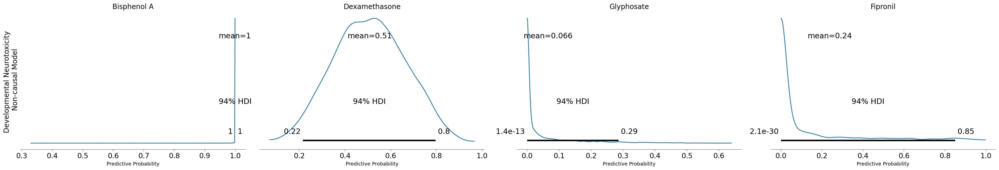

In [14]:
# DNT
ax = az.plot_posterior(trace_nonc, var_names='lp_dnt', coords={'lp_dnt_dim_0': [4, 11, 51, 88]},
                       transform=logistic)

ax[0].set_xlabel("Predictive Probability")
ax[1].set_xlabel("Predictive Probability")
ax[2].set_xlabel("Predictive Probability")
ax[3].set_xlabel("Predictive Probability")

ax[0].set_ylabel("Developmental Neurotoxicity \n Non-causal Model", fontsize=14)

ax[0].set_title("Bisphenol A", fontsize=14)
ax[1].set_title("Dexamethasone", fontsize=14);
ax[2].set_title("Glyphosate", fontsize=14)
ax[3].set_title("Fipronil", fontsize=14);

### MODEL COMPARISON

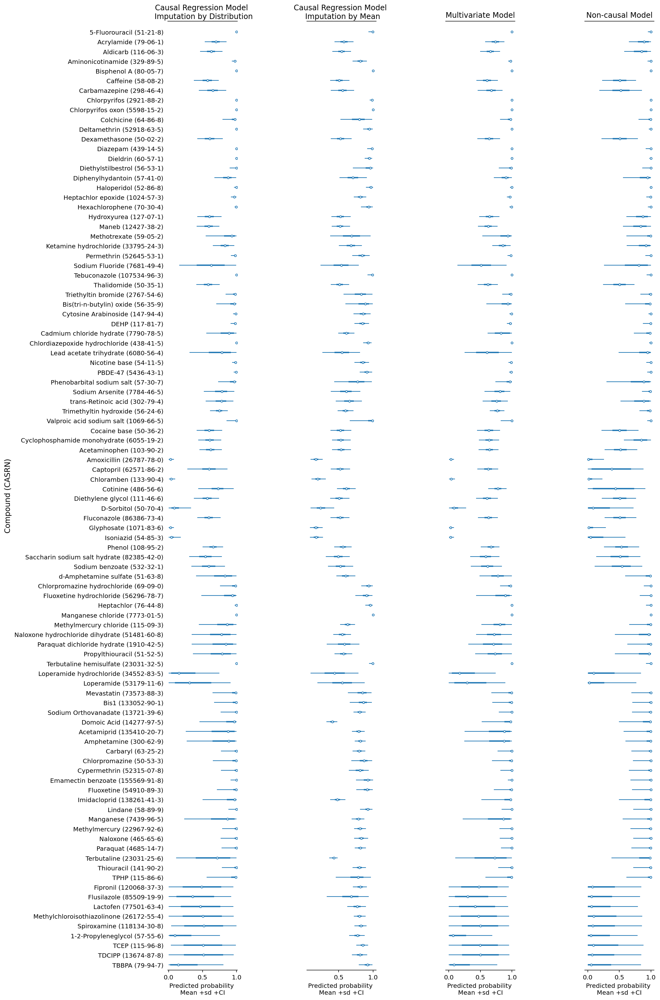

In [23]:
# Comparison for DNT between the four models
fig, ax = plt.subplots(1, 4, figsize=(14,28), sharey=True)


ax0 = pm.forestplot(trace_hierar, 
                   var_names='lp_dnt', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[0])
ax1 = pm.forestplot(trace_meanimpute, 
                   var_names='lp_dnt', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[1])

ax2 = pm.forestplot(trace_mvn, 
                   var_names='lp_dnt', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[2])
ax3 = pm.forestplot(trace_nonc, 
                   var_names='lp_dnt', combined=True, transform=logistic, hdi_prob=0.94,
                   textsize=10, ax = ax[3])

ax[0].set_yticklabels(ylabels[::-1]) #weight = 'bold'

#for ind in range(0,41):
    #ax[0].get_yticklabels()[ind].set_color("dimgray") 

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean +sd +CI")

ax[0].set_ylabel("Compound (CASRN)", fontsize=12)
ax[0].set_title("Causal Regression Model \n Imputation by Distribution", fontsize=12)
ax[1].set_title("Causal Regression Model \n Imputation by Mean", fontsize=12)
ax[2].set_title("Multivariate Model", fontsize=12)
ax[3].set_title("Non-causal Model", fontsize=12);

plt.subplots_adjust(wspace=1)
#plt.tight_layout();

### Brier Score

In [62]:
# Causal regression distribution imputation model
from sklearn.metrics import brier_score_loss
y_true = Y_dnt.copy()
y_prob = pd.Series(np.squeeze(logistic(trace_hierar['lp_dnt'].mean(axis=0))), index=ylabels)
#y_prob = posterior_hierar["y_obs_dnt"].copy() shape (4000, 97, 1)
#y_prob = idata_hierar.posterior_predictive["y_obs_dnt"].copy() shape (4, 1000, 97, 1)
#y_prob = np.squeeze(idata_hierar.posterior_predictive["y_obs_dnt"]).copy() shape (4, 1000, 97)
brier_hierar = brier_score_loss(y_true, y_prob, pos_label=1)
brier_hierar

0.07005953300814317

In [68]:
# Mean imputation
y_true = Y_dnt.copy()
y_prob = pd.Series(np.squeeze(logistic(trace_meanimpute['lp_dnt'].mean(axis=0))), index=ylabels)
#y_prob = posterior_hierar["y_obs_dnt"].copy() shape (4000, 97, 1)
#y_prob = idata_hierar.posterior_predictive["y_obs_dnt"].copy() shape (4, 1000, 97, 1)
#y_prob = np.squeeze(idata_hierar.posterior_predictive["y_obs_dnt"]).copy() shape (4, 1000, 97)
brier_hierar = brier_score_loss(y_true, y_prob, pos_label=1)
brier_hierar

0.15385415254907628

In [49]:
# Multivariate model
y_true = Y_dnt.copy()
y_prob = pd.Series(np.squeeze(logistic(trace_mvn['lp_dnt'].mean(axis=0))), index=ylabels)
#y_prob = posterior_hierar["y_obs_dnt"].copy() shape (4000, 97, 1)
#y_prob = idata_hierar.posterior_predictive["y_obs_dnt"].copy() shape (4, 1000, 97, 1)
#y_prob = np.squeeze(idata_hierar.posterior_predictive["y_obs_dnt"]).copy() shape (4, 1000, 97)
brier_mvn = brier_score_loss(y_true, y_prob)
brier_mvn

0.07160129693575464

In [50]:
# Non-causal model
y_true = Y_dnt.copy()
y_prob = pd.Series(np.squeeze(logistic(trace_nonc['lp_dnt'].mean(axis=0))), index=ylabels)
#y_prob = posterior_hierar["y_obs_dnt"].copy() shape (4000, 97, 1)
#y_prob = idata_hierar.posterior_predictive["y_obs_dnt"].copy() shape (4, 1000, 97, 1)
#y_prob = np.squeeze(idata_hierar.posterior_predictive["y_obs_dnt"]).copy() shape (4, 1000, 97)
brier_nonc = brier_score_loss(y_true, y_prob)
brier_nonc

0.030045887134487508

### Comparison of predictors

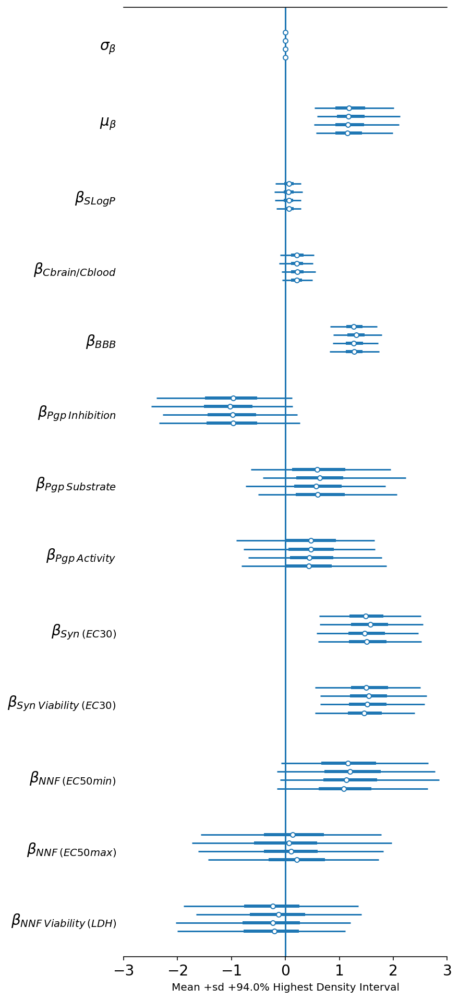

In [91]:
# For manuscript
# Plot parameters for model_hierar
ax = pm.forestplot(trace_hierar, var_names=['mu_beta', 'sd_beta','beta_bdnf', 'beta_syn', 'beta_nnf']);
ax[0].vlines(0., *ax[0].get_ylim());
ax[0].set_xlim([-3,3]);
ax[0].set_yticklabels((r'$\beta_{NNF\:Viability\:(LDH)}$', 
                       r'$\beta_{NNF\:(EC50max)}$', r'$\beta_{NNF\:(EC50min)}$', r'$\beta_{Syn\:Viability\:(EC30)}$', 
                       r'$\beta_{Syn\:(EC30)}$', r'$\beta_{Pgp\: Activity}$', r'$\beta_{Pgp\: Substrate}$', 
                       r'$\beta_{Pgp\: Inhibition}$', r'$\beta_{BBB}$', r'$\beta_{Cbrain/Cblood}$', 
                       r'$\beta_{SLogP}$', r'$\mu_{\beta}$', r'$\sigma_{\beta}$'));
#ax[0].set_title('94.0% Highest Density Interval of Regression Model based on Distribution Imputation');
ax[0].set_xlabel('Mean +sd +94.0% Highest Density Interval');
ax[0].set_title("");
#Four lines per each beta because we run four chains

In [ ]:
# Plot parameters for model_meanimpute
ax = pm.forestplot(trace_meanimpute, var_names=['beta_bdnf', 'beta_syn', 'beta_nnf']);
ax[0].vlines(0., *ax[0].get_ylim());
ax[0].set_xlim([-3,3]);
ax[0].set_yticklabels((r'$\beta_{NNF\:Viability\:(LDH)}$', 
                       r'$\beta_{NNF\:(EC50max)}$', r'$\beta_{NNF\:(EC50min)}$', r'$\beta_{Syn\:Viability\:(EC30)}$', 
                       r'$\beta_{Syn\:(EC30)}$', r'$\beta_{Pgp\: Activity}$', r'$\beta_{Pgp\: Substrate}$', 
                       r'$\beta_{Pgp\: Inhibition}$', r'$\beta_{BBB}$', r'$\beta_{Cbrain/Cblood}$', 
                       r'$\beta_{SLogP}$'));
ax[0].set_title('94.0% Highest Density Interval of Regression Model based on Mean Imputation');

In [ ]:
# Plot parameters for model_mvn
ax = pm.forestplot(trace_mvn, var_names=['beta_bdnf', 'beta_syn', 'beta_nnf']);
ax[0].vlines(0., *ax[0].get_ylim());
ax[0].set_xlim([-3,3]);
ax[0].set_yticklabels((r'$\beta_{NNF\:Viability\:(LDH)}$', 
                       r'$\beta_{NNF\:(EC50max)}$', r'$\beta_{NNF\:(EC50min)}$', r'$\beta_{Syn\:Viability\:(EC30)}$', 
                       r'$\beta_{Syn\:(EC30)}$', r'$\beta_{Pgp\: Activity}$', r'$\beta_{Pgp\: Substrate}$', 
                       r'$\beta_{Pgp\: Inhibition}$', r'$\beta_{BBB}$', r'$\beta_{Cbrain/Cblood}$', 
                       r'$\beta_{SLogP}$'));
ax[0].set_title('94.0% Highest Density Interval of Multivariate Model based on Distribution Imputation');

In [ ]:
# Plot parameters for model_mvn_meanimpute
ax = pm.forestplot(trace_mvn_meanimpute, var_names=['beta_bdnf', 'beta_syn', 'beta_nnf']);
ax[0].vlines(0., *ax[0].get_ylim());
ax[0].set_xlim([-3,3]);
ax[0].set_yticklabels((r'$\beta_{NNF\:Viability\:(LDH)}$', 
                       r'$\beta_{NNF\:(EC50max)}$', r'$\beta_{NNF\:(EC50min)}$', r'$\beta_{Syn\:Viability\:(EC30)}$', 
                       r'$\beta_{Syn\:(EC30)}$', r'$\beta_{Pgp\: Activity}$', r'$\beta_{Pgp\: Substrate}$', 
                       r'$\beta_{Pgp\: Inhibition}$', r'$\beta_{BBB}$', r'$\beta_{Cbrain/Cblood}$', 
                       r'$\beta_{SLogP}$'));
ax[0].set_title('94.0% Highest Density Interval of Multivariate Model based on Mean Imputation');

### Comparison of Predictive Performance

In [ ]:
# ## Effective samples
# extract n_eff values for each model
neff_hierar = az.summary(trace_hierar)['ess_bulk'].values
neff_meanimpute = az.summary(trace_meanimpute)['ess_bulk'].values
neff_mvn = az.summary(trace_mvn)['ess_bulk'].values
neff_mvn_meanimpute = az.summary(trace_mvn_meanimpute)['ess_bulk'].values
# plot distributions
_, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.boxplot([neff_c, neff_nc, neff_mvn, neff_mvn_meanimpute], labels=["Regression \n distribution imputation", 
                                      "Regression \n mean imputation",
                                     "Multivariate Cholesky \n distribution imputation", 
                                     "Multivariate Cholesky \n mean imputation"]);
#ax.set_xlabel('Model', fontsize=14)
ax.set_ylabel('Effective samples');
ax.set_title('Comparison of four models')
sns.despine(right=True, top=True)

In [ ]:
# ##LOO and WAIC
#Is there a way to select only lp and not all variables?

comp_df = az.compare({'model_hierar':trace_hierar,
                      'model_meanimpute':trace_meanimpute})

comp_df

### Watanabe - Akaike Information Criterion [WAIC]

#### BDNF

In [ ]:
model_hierar_waic = az.waic(idata_hierar, var_name='y_obs_bdnf')
model_hierar_waic

In [ ]:
model_meanimpute_waic = az.waic(idata_meanimpute, var_name='y_obs_bdnf')
model_meanimpute_waic

In [ ]:
model_mvn_waic = az.waic(idata_mvn, var_name='y_obs_bdnf')
model_mvn_waic

In [ ]:
model_mvn_meanimpute_waic = az.waic(idata_mvn_meanimpute, var_name='y_obs_bdnf')
model_mvn_meanimpute_waic

#### SYN

In [ ]:
model_hierar_waic = az.waic(idata_hierar, var_name='y_obs_syn')
model_hierar_waic

In [ ]:
model_meanimpute_waic = az.waic(idata_meanimpute, var_name='y_obs_syn')
model_meanimpute_waic

In [ ]:
model_mvn_waic = az.waic(idata_mvn, var_name='y_obs_syn')
model_mvn_waic

In [ ]:
model_mvn_meanimpute_waic = az.waic(idata_mvn_meanimpute, var_name='y_obs_syn')
model_mvn_meanimpute_waic

#### NNF

In [ ]:
model_hierar_waic = az.waic(idata_hierar, var_name='y_obs_nnf')
model_hierar_waic

In [ ]:
model_meanimpute_waic = az.waic(idata_meanimpute, var_name='y_obs_nnf')
model_meanimpute_waic

In [ ]:
model_mvn_waic = az.waic(idata_mvn, var_name='y_obs_nnf')
model_mvn_waic

In [ ]:
model_mvn_meanimpute_waic = az.waic(idata_mvn_meanimpute, var_name='y_obs_nnf')
model_mvn_meanimpute_waic

#### DNT

In [ ]:
model_hierar_waic = az.waic(idata_hierar, var_name='y_obs_dnt')
model_hierar_waic

In [ ]:
model_meanimpute_waic = az.waic(idata_meanimpute, var_name='y_obs_dnt')
model_meanimpute_waic

In [ ]:
model_mvn_waic = az.waic(idata_mvn, var_name='y_obs_dnt')
model_mvn_waic

In [ ]:
model_mvn_meanimpute_waic = az.waic(idata_mvn_meanimpute, var_name='y_obs_dnt')
model_mvn_meanimpute_waic

### Leave-one-out Cross-Validation [LOO]

#### BDNF

In [ ]:
model_hierar_loo = az.loo(idata_hierar, var_name='y_obs_bdnf')
model_hierar_loo

In [ ]:
model_meanimpute_loo = az.loo(idata_meanimpute, var_name='y_obs_bdnf')
model_meanimpute_loo

In [ ]:
model_mvn_loo = az.loo(idata_mvn, var_name='y_obs_bdnf')
model_mvn_loo

In [ ]:
model_mvn_meanimpute_loo = az.loo(idata_mvn_meanimpute, var_name='y_obs_bdnf')
model_mvn_meanimpute_loo

#### SYN

In [ ]:
model_hierar_loo = az.loo(idata_hierar, var_name='y_obs_syn')
model_hierar_loo

In [ ]:
model_meanimpute_loo = az.loo(idata_meanimpute, var_name='y_obs_syn')
model_meanimpute_loo

In [ ]:
model_mvn_loo = az.loo(idata_mvn, var_name='y_obs_syn')
model_mvn_loo

In [ ]:
model_mvn_meanimpute_loo = az.loo(idata_mvn_meanimpute, var_name='y_obs_syn')
model_mvn_meanimpute_loo

#### NNF

In [ ]:
model_hierar_loo = az.loo(idata_hierar, var_name='y_obs_nnf')
model_hierar_loo

In [ ]:
model_meanimpute_loo = az.loo(idata_meanimpute, var_name='y_obs_nnf')
model_meanimpute_loo

In [ ]:
model_mvn_loo = az.loo(idata_mvn, var_name='y_obs_nnf')
model_mvn_loo

In [ ]:
model_mvn_meanimpute_loo = az.loo(idata_mvn_meanimpute, var_name='y_obs_nnf')
model_mvn_meanimpute_loo

#### DNT

In [ ]:
model_hierar_loo = az.loo(idata_hierar, var_name='y_obs_dnt')
model_hierar_loo

In [ ]:
model_meanimpute_loo = az.loo(idata_meanimpute, var_name='y_obs_dnt')
model_meanimpute_loo

In [ ]:
model_mvn_loo = az.loo(idata_mvn, var_name='y_obs_dnt')
model_mvn_loo

In [ ]:
model_mvn_meanimpute_loo = az.loo(idata_mvn_meanimpute, var_name='y_obs_dnt')
model_mvn_meanimpute_loo

In [ ]:
%load_ext watermark
%watermark -n -u -v -iv -w